In [1]:
import h5py
import numpy as np
from matplotlib import pyplot as plt
import os
from tqdm import tqdm
import dereference
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
import scipy
import json

In [2]:
def load_geo(filename='geo-2x2.json'):
    ''' Load geometry file and np-ize it'''
    geo_json={}
    with open(filename, 'r') as f:
        geo_json = json.load(f)

    geo = {}
    for io_group in geo_json.keys():
        y, z = geo_json[io_group]['pix_y_z']
        geo[int(io_group)] = {
            'pix_y_z' :  ( np.array(y), np.array(z) ),
            'pixel_pitch' : geo_json[io_group]['pixel_pitch'],
            'min_y_z' : geo_json[io_group]['min_y_z']
        }

    return geo

geo=load_geo()

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
%matplotlib ipympl

In [15]:
# Some analysis of the data file follows below

In [384]:
#eff_data_f_name = '/pscratch/sd/s/sgberg/large_sample_all_modules.h5'
#dqdx_data_f_name = '/pscratch/sd/s/sgberg/test_dqdx_4.h5'

#eff_data_f_name = '/pscratch/sd/s/sgberg/all_files_2x_pitch_cut.h5'
#dqdx_data_f_name = '/pscratch/sd/s/sgberg/data_dqdx_2x_pixel_pitch_full_fit.h5'

#eff_data_f_name = '/pscratch/sd/s/sgberg/simulation_eff.h5'
#dqdx_data_f_name = '/pscratch/sd/s/sgberg/sim_dqdx.h5'

eff_data_f_name = '/pscratch/sd/s/sgberg/simulation_eff_2x_pitch.h5'
dqdx_data_f_name = '/pscratch/sd/s/sgberg/sim_dqdx_2x_pitch.h5'

In [385]:
# Load efficiency data file

f_eff = h5py.File(eff_data_f_name)
f_dqdx = h5py.File(dqdx_data_f_name)

In [136]:
#eff_data_f_name = '/pscratch/sd/s/sgberg/all_files_2x_pitch_cut.h5'
#dqdx_data_f_name = '/pscratch/sd/s/sgberg/data_dqdx_2x_pixel_pitch.h5'

#eff_data_f_name = '/pscratch/sd/s/sgberg/simulation_eff.h5'

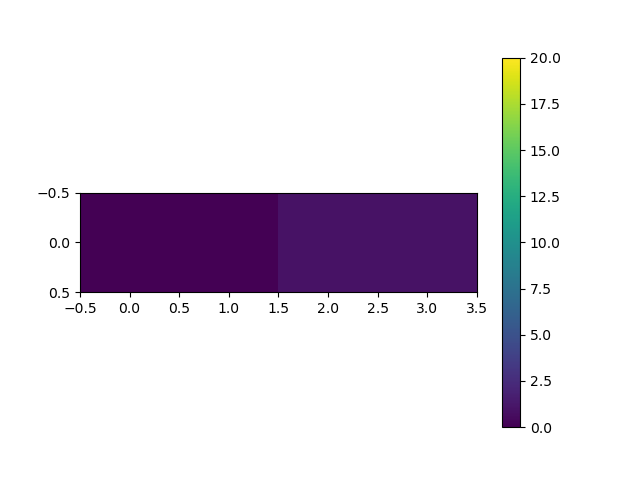

In [278]:
fig=plt.figure()
ax = fig.add_subplot()
im = ax.imshow([[0,0,1,1]], vmin=0, vmax=20)
cbar = plt.colorbar(im, ax=ax)

In [137]:
# MAP out efficiency on each anode, save map to anode_efficiency


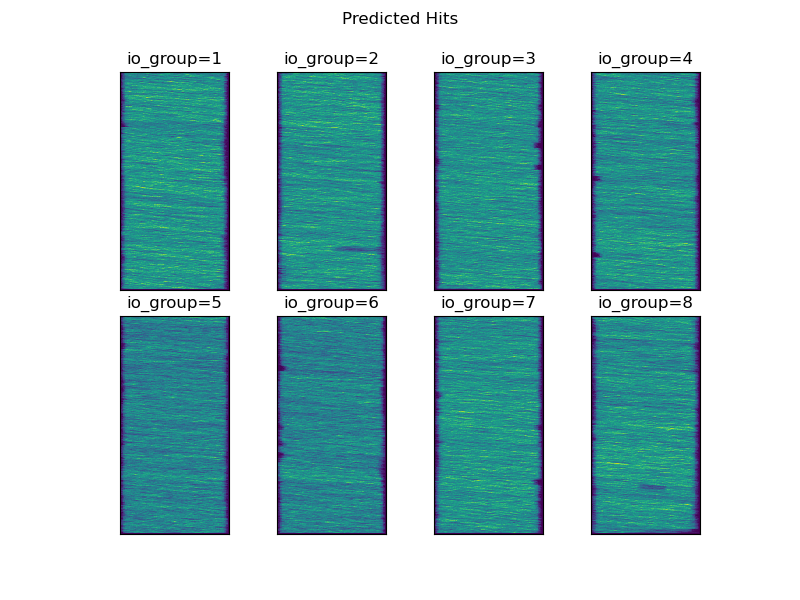

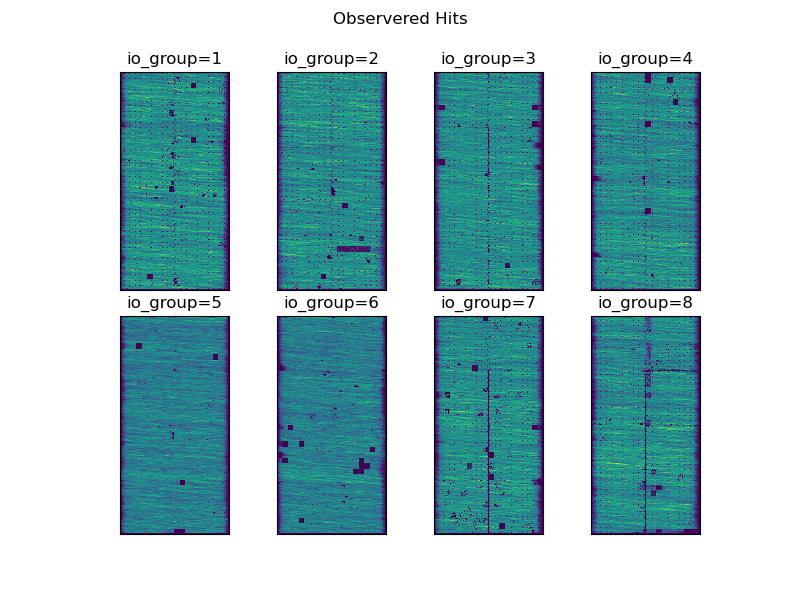

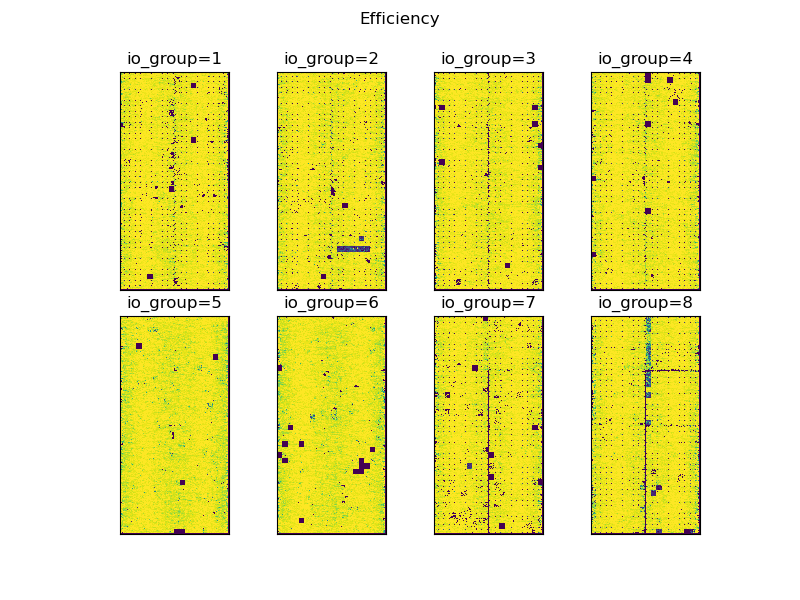

In [386]:
anode_efficiency={}

py, pz = np.array(f_eff['pixel_y']), np.array( f_eff['pixel_z'])


fig_pred = plt.figure(figsize=(8,6))
fig_obs = plt.figure(figsize=(8,6))
fig_eff = plt.figure(figsize=(8,6))

fig_pred.suptitle('Predicted Hits')
fig_obs.suptitle('Observered Hits')
fig_eff.suptitle('Efficiency')

for io_group in range (1,9):

    pix_y_bins = np.concatenate( (geo[io_group]['pix_y_z'][0]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][0][-1]+geo[io_group]['pixel_pitch']/2])) )
    pix_z_bins = np.concatenate( (geo[io_group]['pix_y_z'][1]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][1][-1]+geo[io_group]['pixel_pitch']/2])) )

    pixel_pitch = geo[io_group]['pixel_pitch']
    module = (io_group-1)//2
    anode = (io_group+1) % 2 + 1
    
    mp = (np.array(f_eff['anode']).astype(int) == anode)&\
         (np.array(f_eff['module']).astype(int) == module)&\
         ((np.array(f_eff['pixel_length']) ) > pixel_pitch*0.7)&\
         ((np.array(f_eff['pixel_length'])/np.sin(np.array(f_eff['angle'])) ) >= pixel_pitch)

    mh = mp & ( (f_eff['is_hit'][:].astype(bool)))

    pvals, pbins = np.histogramdd( np.array([ py[mp], pz[mp] ]).transpose(), bins=( pix_y_bins, pix_z_bins ) )
            
    #fig=plt.figure(figsize=(10,5))
    #fig.suptitle('io_group={}'.format(io_group))
    #ax=fig.add_subplot(1,3,1)
    #ax.set_title('all predicted hits, anode={}'.format(anode))
    
    #im = ax.imshow(pvals, origin='lower', interpolation='none')
    #plt.colorbar(im, ax=ax)

    ax = fig_pred.add_subplot(2,4,io_group)
    ax.set_title('io_group={}'.format(io_group))
    ax.imshow(pvals, origin='lower', vmin=0, vmax=80, interpolation='none')
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)
    
    #ax=fig.add_subplot(1,3,2)
    #ax.set_title('observed hits, anode={}'.format(anode))
    hvals, hbins = np.histogramdd( np.array([ py[mh], pz[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ) )
    #im = ax.imshow(hvals, origin='lower', interpolation='none')
    #plt.colorbar(im, ax=ax)

    ax = fig_obs.add_subplot(2,4,io_group)
    ax.set_title('io_group={}'.format(io_group))
    ax.imshow(hvals, origin='lower', vmin=0, vmax=80, interpolation='none')
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)
    
    #ax=fig.add_subplot(1,3,3)
    #ax.set_title('efficiency, anode={}'.format(anode))
    eff = hvals/pvals
    
    eff[np.isnan(eff)]=0
    
    #im = ax.imshow( eff , origin='lower', interpolation='none' )

    #plt.colorbar(im, ax=ax)
    anode_efficiency[io_group] = hvals/pvals

    ax = fig_eff.add_subplot(2,4,io_group)
    ax.set_title('io_group={}'.format(io_group))
    ax.imshow(eff, origin='lower', vmin=0, vmax=1, interpolation='none')

    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)


fig_eff.subplots_adjust(hspace=0.12, wspace=0.05)
fig_obs.subplots_adjust(hspace=0.12, wspace=0.05)
fig_pred.subplots_adjust(hspace=0.12, wspace=0.05)
    

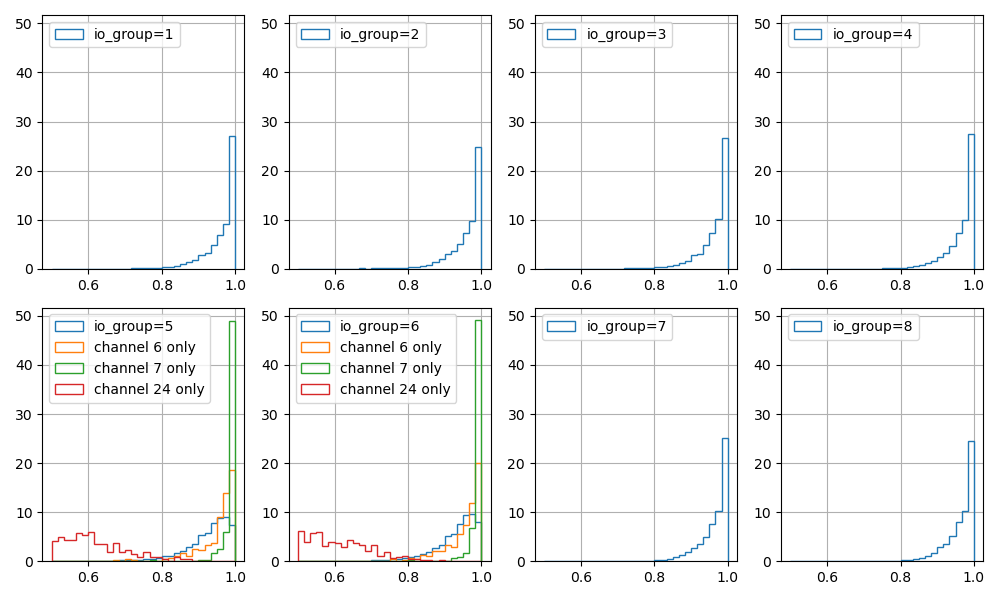

In [383]:
# histogram efficiencies for each anode
fig=plt.figure(figsize=(10,6))

for io_group in anode_efficiency.keys():
    if io_group>1:
        ax=fig.add_subplot(2,4,io_group, sharey=ax)
    else:
        ax=fig.add_subplot(2,4,io_group)
    eff = (anode_efficiency[io_group][20:-20, 20:-20]).flatten()

    mask = ~(((chan_ids_anode[io_group]==6) | (chan_ids_anode[io_group]==7) | (chan_ids_anode[io_group]==24))[20:-20, 20:-20] ).flatten()
    ax.hist(eff[mask], range=(0.5,1), bins=30, label='io_group={}'.format(io_group), histtype='step', density=True)

    if io_group in [5,6]:
        mask = ((chan_ids_anode[io_group]==6)[20:-20, 20:-20]).flatten()
        ax.hist(eff[mask], range=(0.5,1), bins=30, label='channel 6 only'.format(io_group), histtype='step', density=True)
        mask = ((chan_ids_anode[io_group]==7)[20:-20, 20:-20]).flatten()
        ax.hist(eff[mask], range=(0.5,1), bins=30, label='channel 7 only'.format(io_group), histtype='step', density=True)
        mask = ((chan_ids_anode[io_group]==24)[20:-20, 20:-20]).flatten()
        ax.hist(eff[mask], range=(0.5,1), bins=30, label='channel 24 only'.format(io_group), histtype='step', density=True)
    ax.legend(loc=2)
    ax.grid()
    plt.tight_layout()

    #ax.set_ylim(0, 28)

In [275]:
# Get Channel Thresholds
import json

thresholds_2x2 = {}

with open('thresholds_2x2.json', 'r') as f:
    thresholds_2x2 = json.load(f)


thresholds_2x2_change = {}

with open('thresholds-2x2-net_change.json', 'r') as f:
    thresholds_2x2_change = json.load(f)

def unique_channel_id_thresh(io_group, tile, chip_id, channel_id):
    return ((io_group*1000+tile)*1000 + chip_id)*100 + channel_id

def io_channel_to_tiles(io_channel):
    return ( (io_channel-1) // 4) + 1

def unique_to_io_group_thresh(unique):
    return unique//int(1e8)
    
def unique_to_tile_thresh(unique):
    return (unique-int(1e8)*unique_to_io_group_thresh(unique))//int(1e5)

def unique_to_chip_thresh(unique):
    return ((unique-int(1e8)*unique_to_io_group_thresh(unique)) - int(1e5)*unique_to_tile_thresh(unique))//int(1e2)

def unique_to_channel_thresh(unique):
    return ((unique-int(1e8)*unique_to_io_group_thresh(unique))\
            - int(1e5)*unique_to_tile_thresh(unique))\
            - int(1e2)*unique_to_chip_thresh(unique)

# make 2D map of thresholds
#loop over all hit channels from f_eff and get threshold + y,z

hit_mask = f_eff['is_hit'][:].astype(bool)

py = f_eff['pixel_y'][hit_mask]
pz = f_eff['pixel_z'][hit_mask]

unique_ids = unique_channel_id_thresh(      f_eff['hit_io_group'][hit_mask],\
                                            io_channel_to_tiles(f_eff['hit_io_chan'][hit_mask]),\
                                            f_eff['hit_chip_id'][hit_mask],\
                                            f_eff['hit_chan_id'][hit_mask]).astype(int)

unique_ids_set, index = np.unique(unique_ids, return_index=True) 
pys = py[index]
pzs = pz[index]

thresholds = []
chan_ids = []
masked = []
keys=thresholds_2x2.keys()
used_index=set()
for iun in tqdm(range(len(unique_ids_set))):
    ind = index[iun]
    un = unique_ids_set[iun]
    if ind in used_index:
        print('huh??')
    used_index.add(ind)
    if not un==unique_ids[ind]: print('beep boop fix me!!!!')

    found_threshold=False
    if str(un) in keys:
        thresholds.append(thresholds_2x2[str(un)])
        found_threshold=True
                
    if not found_threshold:
        thresholds.append(-1)

    chan_ids.append(unique_to_channel_thresh( un ))

thresholds=np.array(thresholds)
chan_ids=np.array(chan_ids)

thresholds_change = []
keys=thresholds_2x2_change.keys()
used_index=set()
for iun in tqdm(range(len(unique_ids_set))):
    ind = index[iun]
    un = unique_ids_set[iun]
    if ind in used_index:
        print('huh??')
    used_index.add(ind)
    if not un==unique_ids[ind]: print('beep boop fix me!!!!')

    found_threshold=False
    if str(un) in keys:
        thresholds_change.append(thresholds_2x2_change[str(un)])
        found_threshold=True
                
    if not found_threshold:
        thresholds_change.append(-1)

thresholds_change=np.array(thresholds_change)

100%|██████████| 321078/321078 [00:00<00:00, 800473.82it/s]


In [ ]:
# mapping for thresholds in simulation is different

def unique_channel_id_thresh_sim(io_group, tile, chip_id, channel_id):
    return ((io_group*1000+tile)*1000 + chip_id)*100 + channel_id

def io_channel_to_tiles_sim(io_channel):
    return ( (io_channel-1) // 4) + 1

def unique_to_io_group_thresh_sim(unique):
    return unique//int(1e8)
    
def unique_to_tile_thresh_sim(unique):
    return (unique-int(1e8)*unique_to_io_group_thresh(unique))//int(1e5)

def unique_to_chip_thresh_sim(unique):
    return ((unique-int(1e8)*unique_to_io_group_thresh(unique)) - int(1e5)*unique_to_tile_thresh(unique))//int(1e2)

def unique_to_channel_thresh_sim(unique):
    return ((unique-int(1e8)*unique_to_io_group_thresh(unique))\
            - int(1e5)*unique_to_tile_thresh(unique))\
            - int(1e2)*unique_to_chip_thresh(unique)

In [290]:
# Get simulation thresholds, since they are not the same currently

# Get Channel Thresholds
import json

thresholds_2x2 = {}

with open('thresholds_2x2_old.json', 'r') as f:
    thresholds_2x2 = json.load(f)

thresholds_2x2_old = {}

# make 2D map of thresholds
#loop over all hit channels from f_eff and get threshold + y,z

hit_mask = f_eff['is_hit'][:].astype(bool)

py = f_eff['pixel_y'][hit_mask]
pz = f_eff['pixel_z'][hit_mask]

unique_ids = unique_channel_id_thresh(      f_eff['hit_io_group'][hit_mask],\
                                            f_eff['hit_io_chan'][hit_mask],\
                                            f_eff['hit_chip_id'][hit_mask],\
                                            f_eff['hit_chan_id'][hit_mask]).astype(int)

unique_ids_set, index = np.unique(unique_ids, return_index=True) 
pys = py[index]
pzs = pz[index]

thresholds_sim = []
keys=thresholds_2x2.keys()
used_index=set()

for iun in tqdm(range(len(unique_ids_set))):
    ind = index[iun]
    un = unique_ids_set[iun]
    if ind in used_index:
        print('huh??')
    used_index.add(ind)
    if not un==unique_ids[ind]: print('beep boop fix me!!!!')

    found_threshold=False
    if str(un) in keys:
        thresholds_sim.append(thresholds_2x2[str(un)])
        found_threshold=True

    else:
    #    #modify key with different io channel
        io_group = unique_to_io_group_thresh(un)
        io_chan = unique_to_tile_thresh( un )
        chip = unique_to_chip_thresh( un )
        chan = unique_to_channel_thresh( un )

        tile = io_channel_to_tiles(io_chan)
        possible_io_channels = np.array([0, 1, 2, 3]) + tile*4

        for pioc in possible_io_channels:
            new_unique = unique_channel_id_thresh(io_group, pioc, chip, chan)
            if str(new_unique) in keys:
                thresholds_sim.append(thresholds_2x2[str(new_unique)])
                found_threshold=True
                break
                
    if not found_threshold:
        thresholds_sim.append(-1)

thresholds_sim=np.array(thresholds_sim)

100%|██████████| 321078/321078 [00:01<00:00, 241530.33it/s]


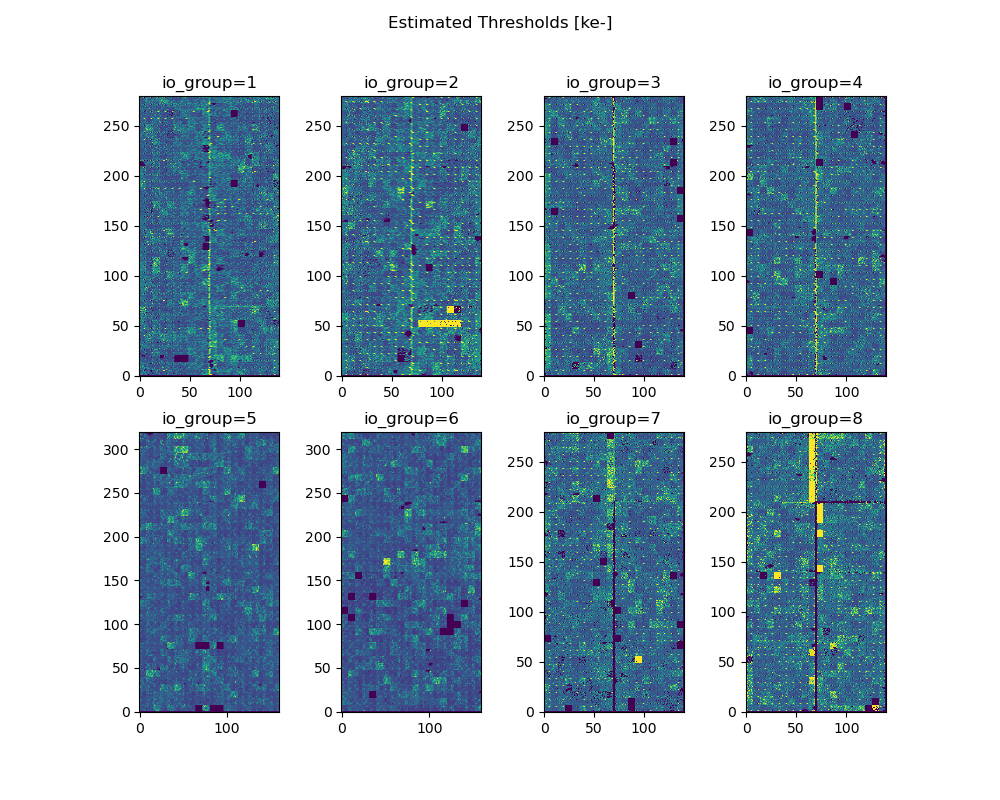

In [283]:
# make a map of thresholds
thresholds_anode = {}
thresholds_change_anode = {}
chan_ids_anode = {}

fig=plt.figure(figsize=(10,8))
fig.suptitle('Estimated Thresholds [ke-]')

for io_group in range(1,9):

    pix_y_bins = np.concatenate( (geo[io_group]['pix_y_z'][0]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][0][-1]+geo[io_group]['pixel_pitch']/2])) )
    pix_z_bins = np.concatenate( (geo[io_group]['pix_y_z'][1]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][1][-1]+geo[io_group]['pixel_pitch']/2])) )

    pixel_pitch = geo[io_group]['pixel_pitch']

    mh = unique_to_io_group_thresh(unique_ids_set)==io_group

    ax=fig.add_subplot(2,4,io_group)
    ax.set_title('io_group={}'.format(io_group))
    vals, bins = np.histogramdd( np.array([ pys[mh], pzs[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=thresholds[mh] )
    im = ax.imshow(vals, origin='lower', vmin=0, vmax=20)
    #plt.colorbar(im, ax=ax)

    thresholds_anode[io_group]=vals

    vals, bins = np.histogramdd( np.array([ pys[mh], pzs[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=thresholds_change[mh] )
    thresholds_change_anode[io_group]=vals

    vals, bins = np.histogramdd( np.array([ pys[mh], pzs[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=chan_ids[mh] )

    chan_ids_anode[io_group]=vals

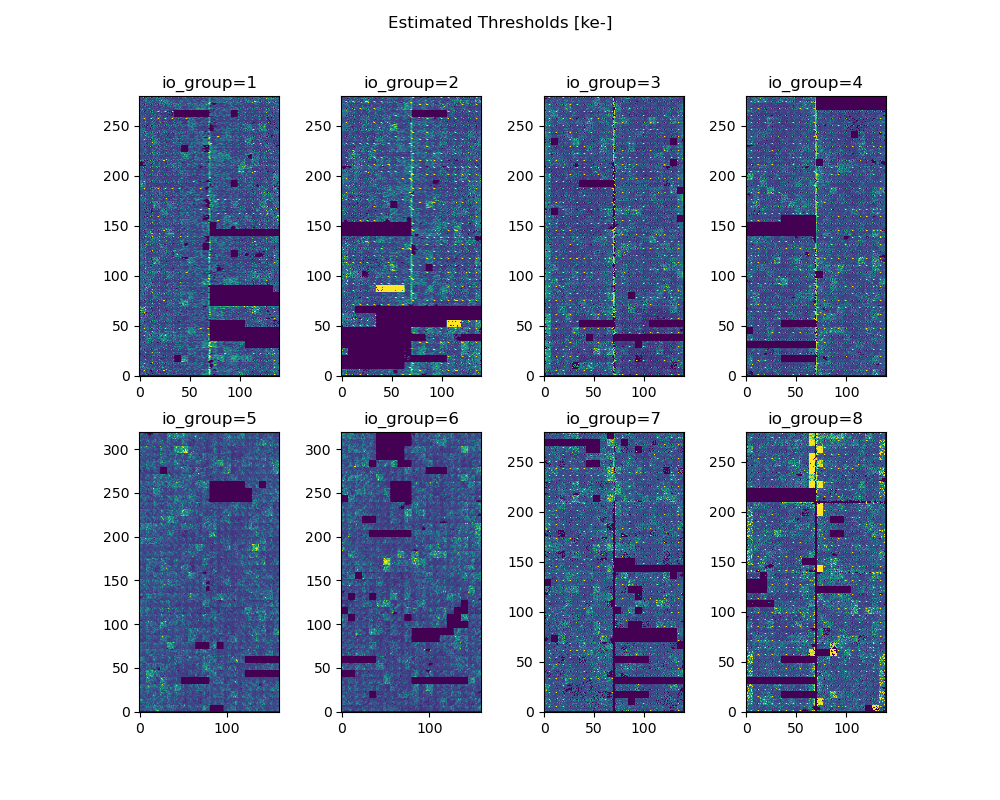

In [291]:
# make a map of thresholds
thresholds_sim_anode = {}

fig=plt.figure(figsize=(10,8))
fig.suptitle('Estimated Thresholds [ke-]')

for io_group in range(1,9):

    pix_y_bins = np.concatenate( (geo[io_group]['pix_y_z'][0]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][0][-1]+geo[io_group]['pixel_pitch']/2])) )
    pix_z_bins = np.concatenate( (geo[io_group]['pix_y_z'][1]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][1][-1]+geo[io_group]['pixel_pitch']/2])) )

    pixel_pitch = geo[io_group]['pixel_pitch']

    mh = unique_to_io_group_thresh(unique_ids_set)==io_group

    ax=fig.add_subplot(2,4,io_group)
    ax.set_title('io_group={}'.format(io_group))
    vals, bins = np.histogramdd( np.array([ pys[mh], pzs[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=thresholds_sim[mh] )
    im = ax.imshow(vals, origin='lower', vmin=0, vmax=20)
    #plt.colorbar(im, ax=ax)

    thresholds_sim_anode[io_group]=vals


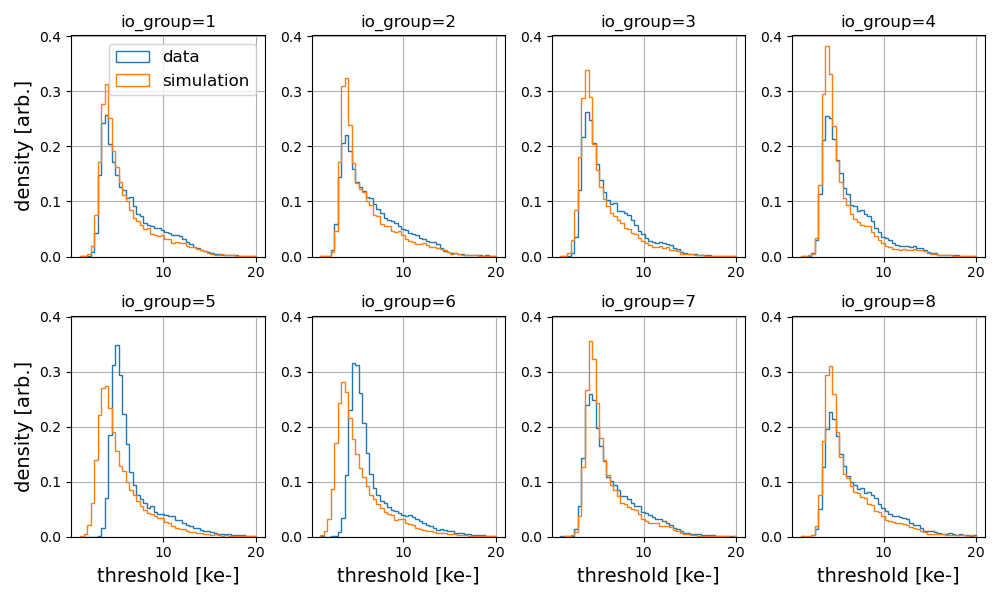

In [354]:

# histogram dqdx means for all anodes
fig=plt.figure(figsize=(10,6))

for io_group in anode_efficiency.keys():
    if io_group>1:
        ax=fig.add_subplot(2,4,io_group, sharey=ax)
    else:
        ax=fig.add_subplot(2,4,io_group)
    dqdx = thresholds_anode[io_group].flatten() + thresholds_change_anode[io_group].flatten()
    ax.hist(dqdx, range=(1,20), bins=50, label='data', histtype='step', density=True)
    dqdx = thresholds_sim_anode[io_group].flatten()
    ax.hist(dqdx, range=(1,20), bins=50, label='simulation', histtype='step', density=True)
    ax.set_title('io_group={}'.format(io_group))
    if io_group==1: ax.legend(fontsize=12)
    ax.grid()
    if io_group > 4: ax.set_xlabel('threshold [ke-]', fontsize=14)
    if io_group in [1,5]: ax.set_ylabel('density [arb.]', fontsize=14)
   # ax.set_yscale('log')
    plt.tight_layout()

In [12]:
f_dqdx.keys()

<KeysViewHDF5 ['anode', 'eta_fit', 'fit_flag', 'module', 'mu_fit', 'trim_mean', 'trim_std', 'y', 'z']>

In [15]:
f_dqdx['anode'][-10]

2.0

In [341]:
anode_dqdx = f_dqdx['anode'][:]
module_dqdx = f_dqdx['module'][:]
y_dqdx = f_dqdx['y'][:]
z_dqdx = f_dqdx['z'][:]
mu_dqdx = f_dqdx['mu_fit'][:]
trim_mean_dqdx = f_dqdx['trim_mean'][:]
fit_flag_dqdx = f_dqdx['fit_flag'][:]

In [342]:
set(fit_flag_dqdx)

{-1.0}

In [343]:
#Map out dQdx

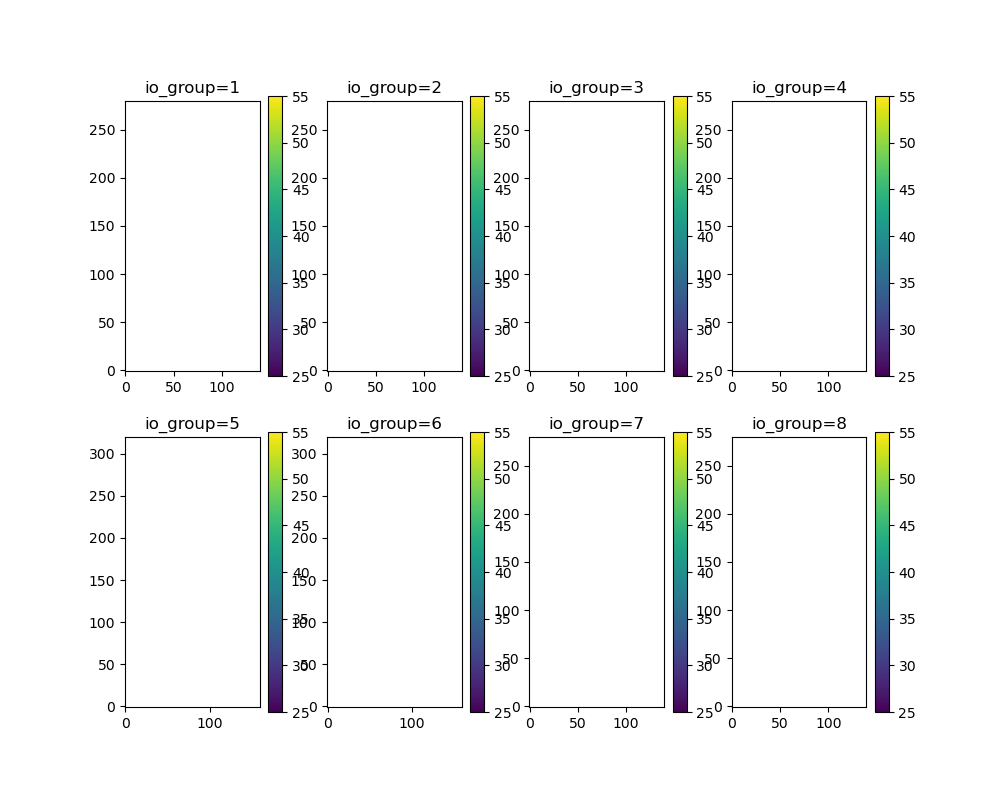

In [344]:
anode_mu_dqdx={}
fig=plt.figure(figsize=(10,8))
for io_group in range(1,9):

    module = (io_group-1)//2
    anode = (io_group+1) % 2 + 1

    pix_y_bins = np.concatenate( (geo[io_group]['pix_y_z'][0]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][0][-1]+geo[io_group]['pixel_pitch']/2])) )
    pix_z_bins = np.concatenate( (geo[io_group]['pix_y_z'][1]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][1][-1]+geo[io_group]['pixel_pitch']/2])) )

    pixel_pitch = geo[io_group]['pixel_pitch']

    ax = fig.add_subplot(2,4,io_group)
    
    m = (np.array(anode_dqdx).astype(int)==anode) & (np.array(module_dqdx).astype(int)==module)  
    m = m & (fit_flag_dqdx > 0)
    
    vals, bins = np.histogramdd( np.array([ y_dqdx, z_dqdx ]).transpose()[m], weights=np.array(mu_dqdx)[m], bins=(pix_y_bins, pix_z_bins)  )
    vals[vals==0]=np.nan
    im = ax.imshow(vals, origin='lower', interpolation='none', vmin=25, vmax=55)

    anode_mu_dqdx[io_group]=vals
    ax.set_title('io_group={}'.format(io_group))
    plt.colorbar(im, ax=ax)

Text(0.5, 0.98, '2x2 Data, dQ/dX (truncated mean)')

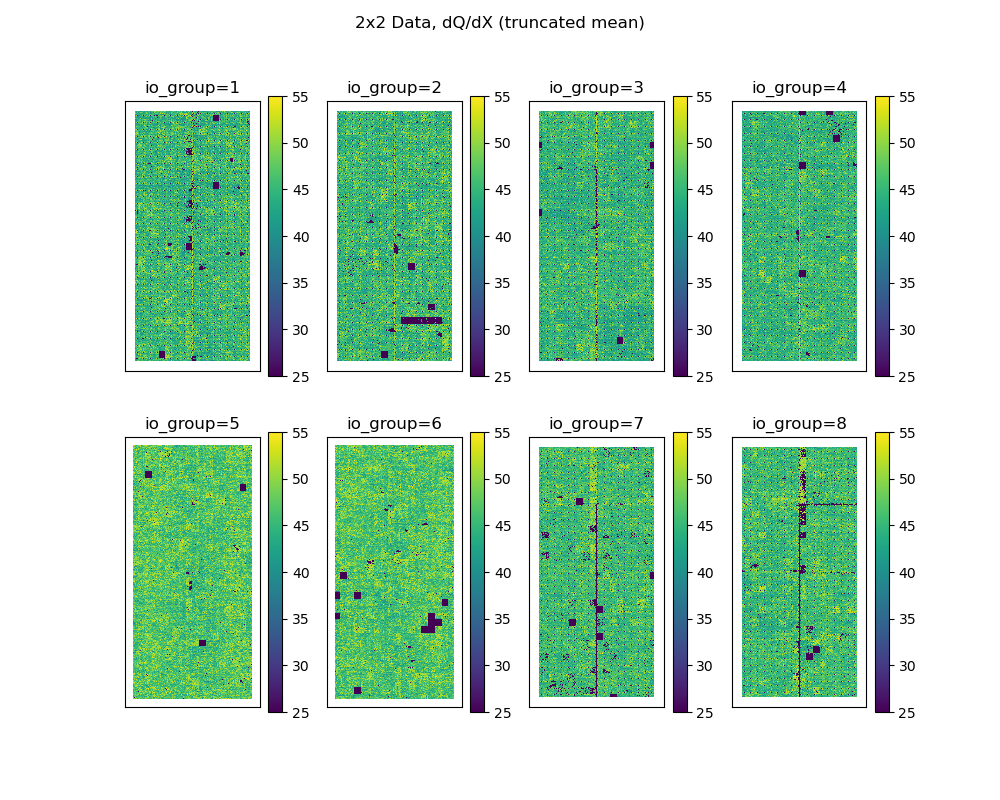

In [345]:
anode_trim_mean_dqdx={}
fig=plt.figure(figsize=(10,8))
for io_group in range(1,9):

    module = (io_group-1)//2
    anode = (io_group+1) % 2 + 1

    pix_y_bins = np.concatenate( (geo[io_group]['pix_y_z'][0]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][0][-1]+geo[io_group]['pixel_pitch']/2])) )
    pix_z_bins = np.concatenate( (geo[io_group]['pix_y_z'][1]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][1][-1]+geo[io_group]['pixel_pitch']/2])) )

    pixel_pitch = geo[io_group]['pixel_pitch']

    ax = fig.add_subplot(2,4,io_group)
    
    m = (np.array(anode_dqdx).astype(int)==anode) & (np.array(module_dqdx).astype(int)==module)  
    
    vals, bins = np.histogramdd( np.array([ y_dqdx, z_dqdx ]).transpose()[m], weights=np.array(trim_mean_dqdx)[m], bins=(pix_y_bins, pix_z_bins)  )
    vals[vals==0]=np.nan
    im = ax.imshow(vals, origin='lower', interpolation='none', vmin=25, vmax=55)

    anode_trim_mean_dqdx[io_group]=vals
    ax.set_title('io_group={}'.format(io_group))
    plt.colorbar(im, ax=ax)
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)

fig.suptitle('2x2 Data, dQ/dX (truncated mean)')

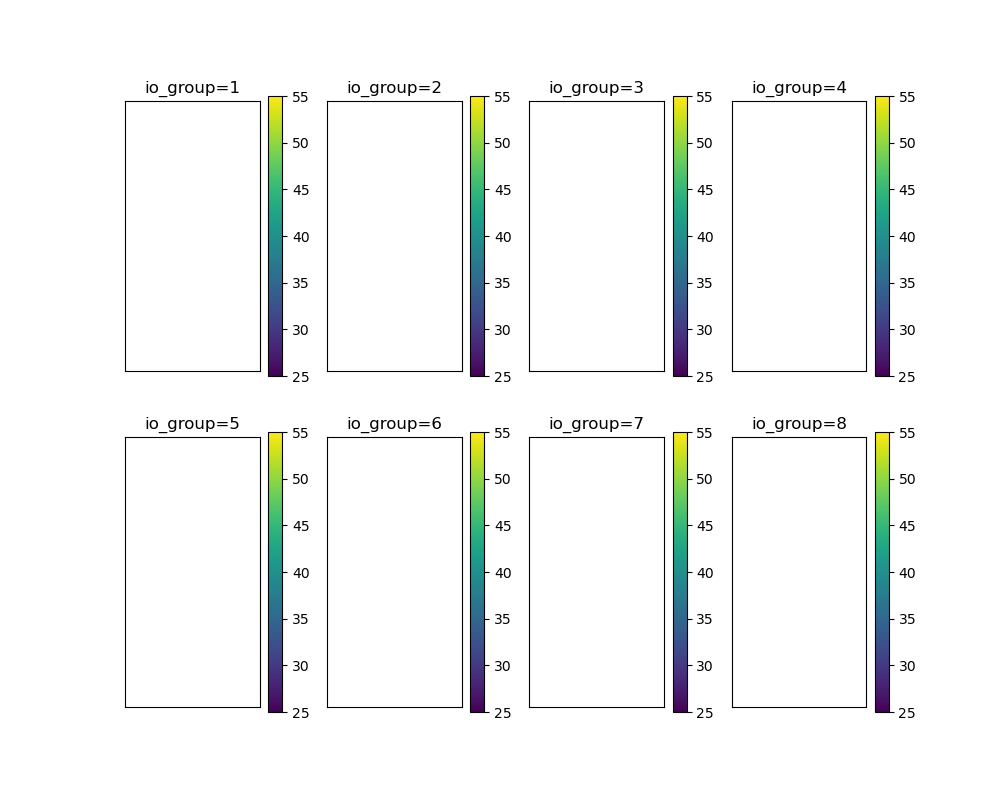

In [346]:
anode_trim_mean_fit_only_dqdx={}
fig = plt.figure(figsize=(10,8))

for io_group in range(1,9):

    module = (io_group-1)//2
    anode = (io_group+1) % 2 + 1

    pix_y_bins = np.concatenate( (geo[io_group]['pix_y_z'][0]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][0][-1]+geo[io_group]['pixel_pitch']/2])) )
    pix_z_bins = np.concatenate( (geo[io_group]['pix_y_z'][1]-geo[io_group]['pixel_pitch']/2, np.array([geo[io_group]['pix_y_z'][1][-1]+geo[io_group]['pixel_pitch']/2])) )

    pixel_pitch = geo[io_group]['pixel_pitch']

    ax = fig.add_subplot(2,4,io_group)
    
    m = (np.array(anode_dqdx).astype(int)==anode) & (np.array(module_dqdx).astype(int)==module)  
    m = m & (fit_flag_dqdx > 0)
    
    vals, bins = np.histogramdd( np.array([ y_dqdx, z_dqdx ]).transpose()[m], weights=np.array(trim_mean_dqdx)[m], bins=(pix_y_bins, pix_z_bins)  )
    vals[vals==0]=np.nan
    im = ax.imshow(vals, origin='lower', interpolation='none', vmin=25, vmax=55)

    anode_trim_mean_fit_only_dqdx[io_group]=vals
    ax.set_title('io_group={}'.format(io_group))
    plt.colorbar(im, ax=ax)
    ax.get_yaxis().set_visible(False)
    ax.get_xaxis().set_visible(False)
    

In [159]:
np.std(dqdx[dqdx>0])

4.702047606656428

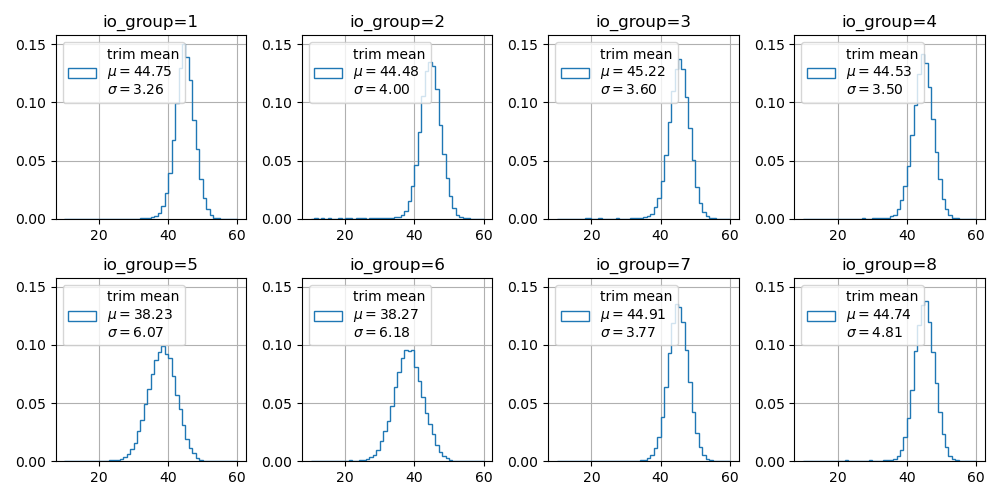

In [322]:
# histogram dqdx means for all anodes
fig=plt.figure(figsize=(10,5))

for io_group in anode_efficiency.keys():
    if io_group>1:
        ax=fig.add_subplot(2,4,io_group, sharey=ax)
    else:
        ax=fig.add_subplot(2,4,io_group)

    mask = ~((chan_ids_anode[io_group]==6) | (chan_ids_anode[io_group]==7) | (chan_ids_anode[io_group]==24)).flatten()
    dqdx = anode_trim_mean_dqdx[io_group].flatten()
    
    ax.hist(dqdx[mask], range=(10,60), bins=50, label='trim mean\n$\mu={:0.2f}$\n$\sigma={:0.2f}$'.format(np.mean(dqdx[dqdx>0]), np.std(dqdx[dqdx>0])), histtype='step', density=True)

   # dqdx = anode_mu_dqdx[io_group].flatten()[ (anode_trim_mean_fit_only_dqdx[io_group].flatten() > 0) & mask]
   # ax.hist(dqdx, range=(10,60), bins=50, label='Fit MPV\n$\mu={:0.2f}$\n$\sigma={:0.2f}$'.format(np.mean(dqdx[dqdx>0]), np.std(dqdx[dqdx>0])), histtype='step', density=True)

    ax.legend(loc=2)
    ax.grid()
    ax.set_title('io_group={}'.format(io_group))
    plt.tight_layout()

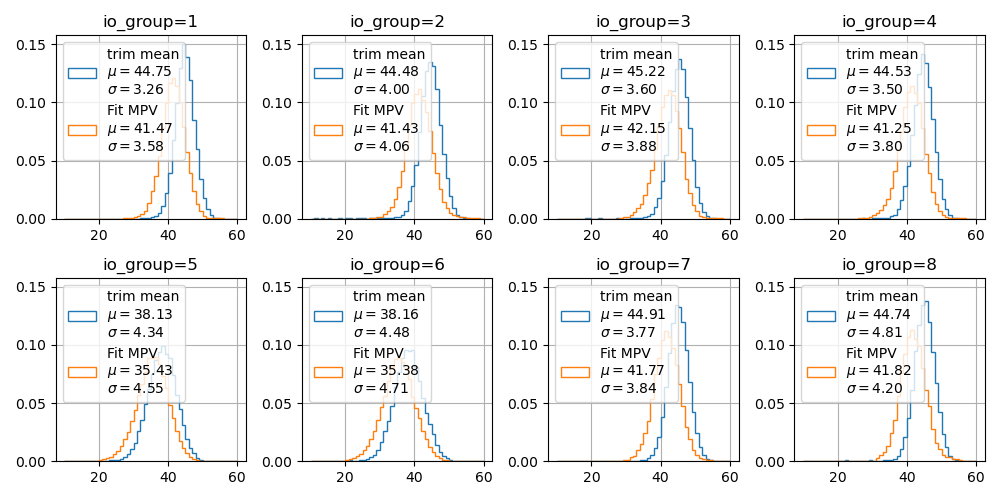

In [325]:
# histogram dqdx means for all anodes
fig=plt.figure(figsize=(10,5))

for io_group in anode_efficiency.keys():
    if io_group>1:
        ax=fig.add_subplot(2,4,io_group, sharey=ax)
    else:
        ax=fig.add_subplot(2,4,io_group)

    multiplier=1
    
    if io_group in [5,6]: multiplier = ( geo[1]['pixel_pitch'] / geo[5]['pixel_pitch'])**2
    thresholds = (thresholds_anode[io_group].flatten()+thresholds_change[io_group].flatten())*multiplier

    mask = (~((chan_ids_anode[io_group]==6) | (chan_ids_anode[io_group]==7) | (chan_ids_anode[io_group]==24)).flatten())
    dqdx = anode_trim_mean_fit_only_dqdx[io_group].flatten()    
    ax.hist(dqdx[mask], range=(10,60), bins=50, label='trim mean\n$\mu={:0.2f}$\n$\sigma={:0.2f}$'.format(np.mean(dqdx[(dqdx>0) & mask]), np.std(dqdx[(dqdx>0) & mask])), histtype='step', density=True)

    
    dqdx = anode_mu_dqdx[io_group].flatten()[ (anode_trim_mean_fit_only_dqdx[io_group].flatten() > 0) & mask ]
    ax.hist(dqdx, range=(10,60), bins=50, label='Fit MPV\n$\mu={:0.2f}$\n$\sigma={:0.2f}$'.format(np.mean(dqdx[ (dqdx>0)]), np.std(dqdx[(dqdx>0)])), histtype='step', density=True)
    ax.legend(loc=2)
    ax.grid()
    ax.set_title('io_group={}'.format(io_group))
    plt.tight_layout()

    #fig.suptitle('threshold/pixel pitch {:0.1f}-{:0.1f} [ke-/cm]'.format(10/geo[1]['pixel_pitch'] , 15/geo[1]['pixel_pitch']  ))

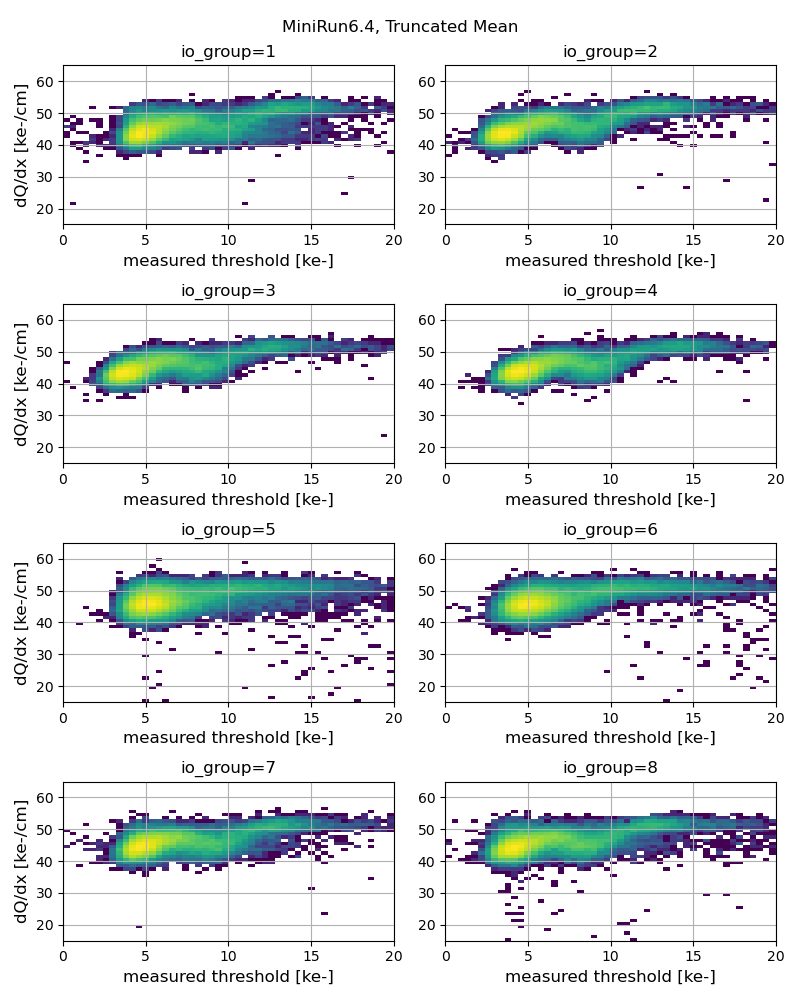

In [347]:
# histogram dqdx means for all anodes
fig=plt.figure(figsize=(8,10))

for io_group in anode_efficiency.keys():
    if io_group>1:
        ax=fig.add_subplot(4,2,io_group, sharey=ax)
    else:
        ax=fig.add_subplot(4,2,io_group)
        
    dqdx = anode_trim_mean_dqdx[io_group].flatten()

    multiplier=1

    if io_group in [5,6]: multiplier = geo[1]['pixel_pitch'] / geo[5]['pixel_pitch']
        
    thresholds = (thresholds_anode[io_group].flatten()+thresholds_change[io_group].flatten())*multiplier

    mask = (~((chan_ids_anode[io_group]==6) | (chan_ids_anode[io_group]==7) | (chan_ids_anode[io_group]==24) | (chan_ids_anode[io_group]==131)).flatten())

    vals, bins = np.histogramdd( np.array([thresholds[mask], dqdx[mask]]).transpose(), bins=50, range=( (0,20), (15, 65) )  )
    ax.imshow(np.log(vals.transpose()), origin='lower', interpolation='none', extent=(0,20, 15, 65), aspect='auto')
    ax.grid()
    ax.set_title('io_group={}'.format(io_group))
    ax.set_xlabel('measured threshold [ke-]', fontsize=12)
    if io_group % 2 == 1: ax.set_ylabel('dQ/dx [ke-/cm]', fontsize=12)
    plt.tight_layout()
    fig.suptitle('MiniRun6.4, Truncated Mean')
    

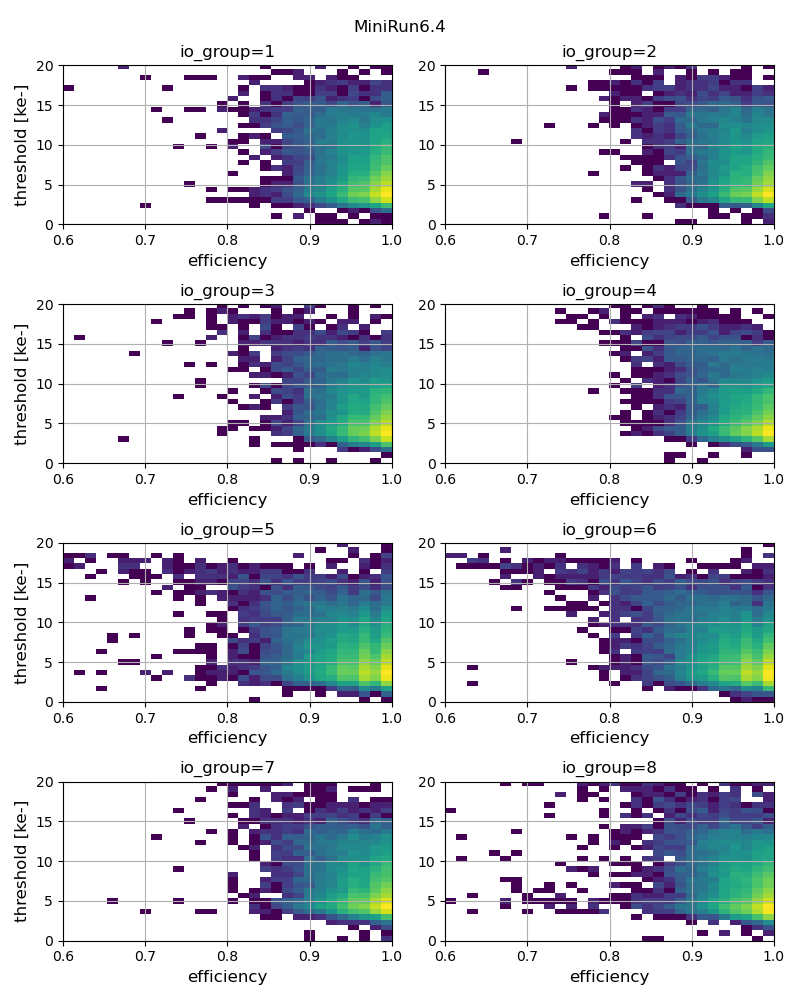

In [394]:
# histogram dqdx means for all anodes
fig=plt.figure(figsize=(8,10))

for io_group in anode_efficiency.keys():
    if io_group>1:
        ax=fig.add_subplot(4,2,io_group, sharey=ax)
    else:
        ax=fig.add_subplot(4,2,io_group)
    eff = ((anode_efficiency[io_group])[20:-20, 20:-20]).flatten()
    
    multiplier=1

    #if io_group in [5,6]: multiplier = geo[1]['pixel_pitch'] / geo[5]['pixel_pitch']

    mask = (~((chan_ids_anode[io_group]==6) | (chan_ids_anode[io_group]==7) | (chan_ids_anode[io_group]==24))[20:-20, 20:-20]).flatten()
    thresholds = (thresholds_sim_anode[io_group])[20:-20, 20:-20].flatten() #((thresholds_anode[io_group]+thresholds_change[io_group])[20:-20, 20:-20]).flatten()

    vals, bins = np.histogramdd( np.array([ (eff[mask]), thresholds[mask]]).transpose(), bins=30, range=( (0.6,1), (0,20) )  )
    ax.imshow(np.log(vals.transpose()), origin='lower', interpolation='none', extent=(0.6,1, 0,20), aspect='auto')
    ax.grid()
    ax.set_title('io_group={}'.format(io_group))

    ax.set_xlabel('efficiency', fontsize=12)
    if io_group % 2 == 1: ax.set_ylabel('threshold [ke-]', fontsize=12)
    plt.tight_layout()

    plt.suptitle('MiniRun6.4')
    

In [152]:
from matplotlib.patches import Rectangle

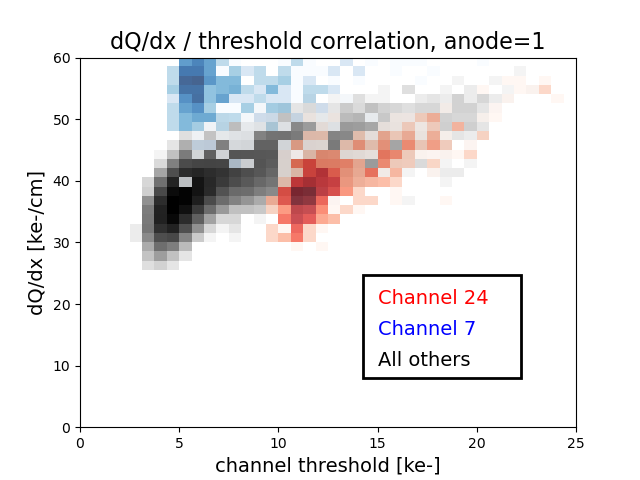

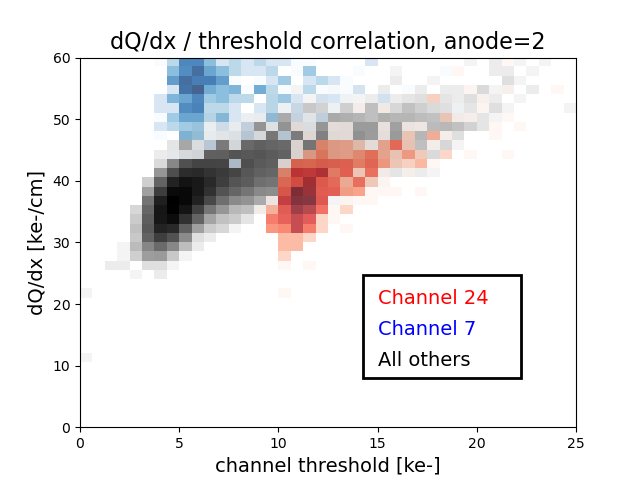

In [170]:
anode=1

for anode in [1,2]:
    fig=plt.figure()
    ax=fig.add_subplot()

    eff = anode_efficiency[anode]
    dqdx_mean = anode_trim_mean_dqdx[anode]

    mask=~((chan_ids_anode[anode]==24)|(chan_ids_anode[anode]==6)|(chan_ids_anode[anode]==7)).flatten()
    vals, bins = np.histogramdd( np.array([(thresholds_anode[anode]+thresholds_change_anode[anode]).flatten()[mask], dqdx_mean.flatten()[mask]]).transpose(), bins=(40,40), range=( (0,25), (0, 60)  ) )

    im1 = ax.imshow(np.log10(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0,25,0,60), cmap='Greys')

    mask=((chan_ids_anode[anode]==24)).flatten()
    vals, bins = np.histogramdd( np.array([(thresholds_anode[anode]+thresholds_change_anode[anode]).flatten()[mask], dqdx_mean.flatten()[mask]]).transpose(), bins=(40,40), range=( (0,25), (0, 60)  ) )

    im2 = ax.imshow(np.log10(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0,25,0,60), cmap='Reds', alpha=0.75)

    mask=((chan_ids_anode[anode]==7)).flatten()
    vals, bins = np.histogramdd( np.array([(thresholds_anode[anode]+thresholds_change_anode[anode]).flatten()[mask], dqdx_mean.flatten()[mask]]).transpose(), bins=(40,40), range=( (0,25), (0, 60)  ) )

    im3= ax.imshow(np.log10(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0,25,0,60), cmap='Blues', alpha=0.75)
    
    ax.set_title('dQ/dx / threshold correlation, anode={}'.format(anode), fontsize=16)
    ax.set_xlabel('channel threshold [ke-]', fontsize=14)
    ax.set_ylabel('dQ/dx [ke-/cm]', fontsize=14)

    ax.text(15, 20, 'Channel 24', color='red', fontsize=14)
    ax.text(15, 15, 'Channel 7', color='blue', fontsize=14)
    ax.text(15, 10, 'All others', color='black', fontsize=14)
    
    ax.add_patch(Rectangle((14.25, 8), 8, 16.75,
             edgecolor = 'black',
             facecolor = 'white',
             fill=True,
             lw=2))

    

    #ax.scatter( eff.flatten()[mask], dqdx_mean.flatten()[mask]  )

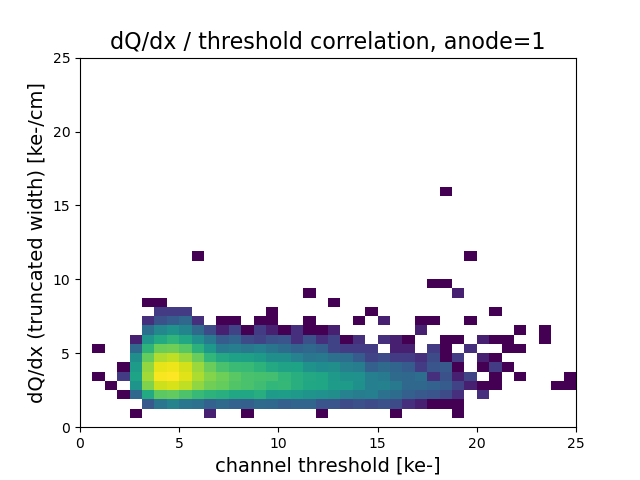

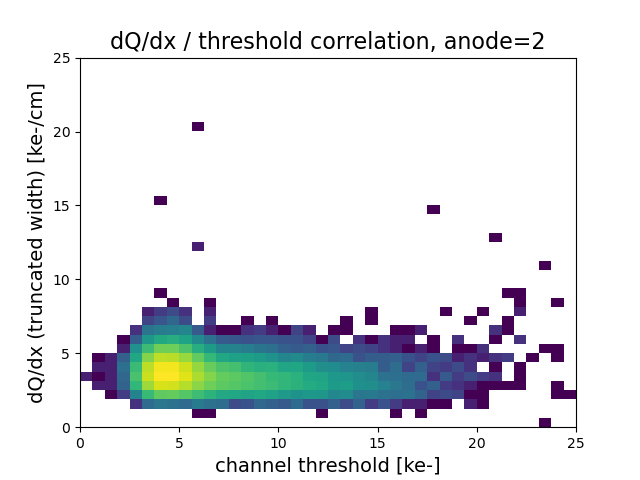

In [57]:
anode=1

for anode in [1,2]:
    eff = anode_efficiency[anode]
    dqdx_std = anode_trim_std_dqdx[anode]

    mask=~((chan_ids_anode[anode]==24)|(chan_ids_anode[anode]==6)|(chan_ids_anode[anode]==7)).flatten()

    vals, bins = np.histogramdd( np.array([thresholds_anode[anode].flatten()[mask], dqdx_std.flatten()[mask]]).transpose(), bins=(40,40), range=( (0,25), (0, 25)  ) )

    fig=plt.figure()
    ax=fig.add_subplot()
    ax.imshow(np.log(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0,25,0,25))

    ax.set_title('dQ/dx / threshold correlation, anode={}'.format(anode), fontsize=16)
    ax.set_xlabel('channel threshold [ke-]', fontsize=14)
    ax.set_ylabel('dQ/dx (truncated width) [ke-/cm]', fontsize=14)
    #ax.scatter( eff.flatten()[mask], dqdx_mean.flatten()[mask]  )

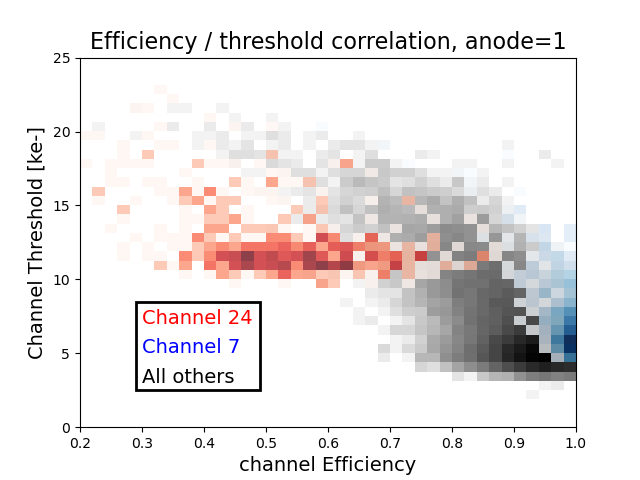

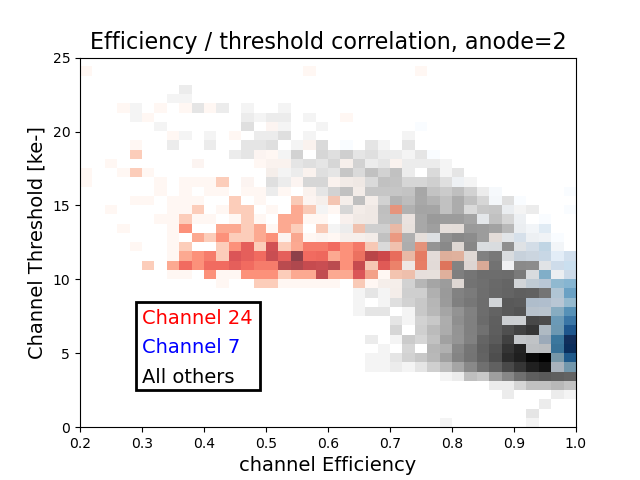

In [185]:
anode=1

for anode in [1,2]:
    fig=plt.figure()
    ax=fig.add_subplot()

    eff = anode_efficiency[anode]
    dqdx_mean = anode_trim_mean_dqdx[anode]

    mask=~((chan_ids_anode[anode]==24)|(chan_ids_anode[anode]==6)|(chan_ids_anode[anode]==7)).flatten()
    vals, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask], (thresholds_anode[anode]+thresholds_change_anode[anode]).flatten()[mask]]).transpose(), bins=(40,40), range=( (0.2,1), (0, 25)  ) )

    im1 = ax.imshow(np.log10(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0.2,1,0,25), cmap='Greys')

    mask=((chan_ids_anode[anode]==24)).flatten()
    vals, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask], (thresholds_anode[anode]+thresholds_change_anode[anode]).flatten()[mask]]).transpose(), bins=(40,40), range=( (0.2,1), (0, 25)  ) )

    im2 = ax.imshow(np.log10(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0.2,1,0,25), cmap='Reds', alpha=0.75)

    mask=((chan_ids_anode[anode]==7)).flatten()
    vals, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask], (thresholds_anode[anode]+thresholds_change_anode[anode]).flatten()[mask]]).transpose(), bins=(40,40), range=( (0.2,1), (0, 25)  ) )

    im3= ax.imshow(np.log10(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0.2,1,0,25), cmap='Blues', alpha=0.75)
    
    ax.set_title('Efficiency / threshold correlation, anode={}'.format(anode), fontsize=16)
    ax.set_xlabel('channel Efficiency', fontsize=14)
    ax.set_ylabel('Channel Threshold [ke-]', fontsize=14)

    ax.text(0.3, 7, 'Channel 24', color='red', fontsize=14)
    ax.text(0.3, 5, 'Channel 7', color='blue', fontsize=14)
    ax.text(0.3, 3, 'All others', color='black', fontsize=14)
    
    ax.add_patch(Rectangle((0.29, 2.5),0.2,6,
             edgecolor = 'black',
             facecolor = 'white',
             fill=True,
             lw=2))

    

    #ax.scatter( eff.flatten()[mask], dqdx_mean.flatten()[mask]  )

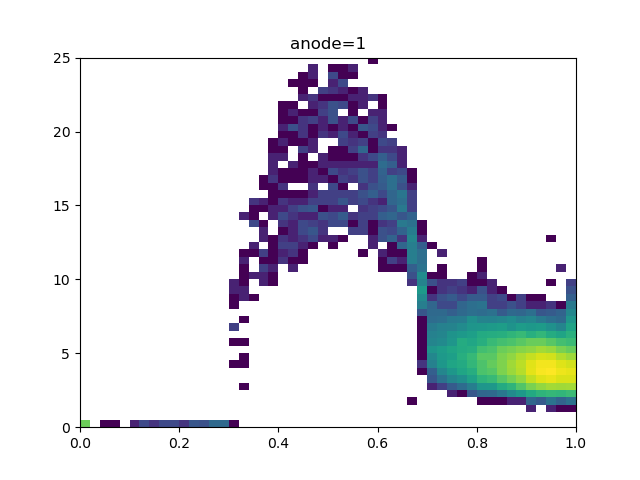

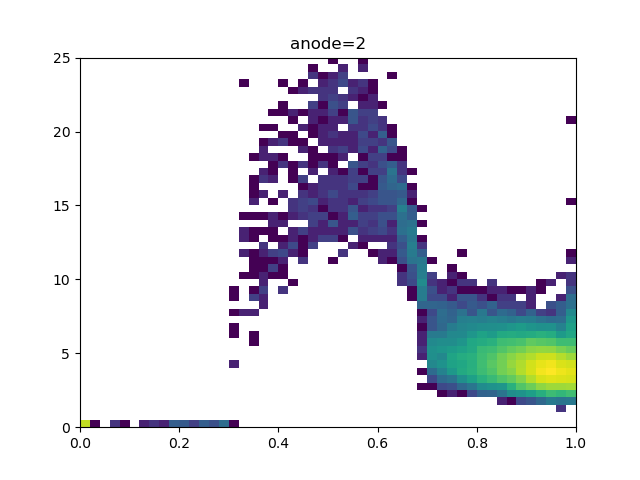

In [281]:
anode=1

for anode in [1,2]:
    eff = anode_efficiency[anode]
    dqdx_std = anode_trim_std_dqdx[anode]

    vals, bins = np.histogramdd( np.array([eff.flatten(), dqdx_std.flatten()]).transpose(), bins=(50,50), range=( (0,1), (0, 25)  ) )

    fig=plt.figure()
    ax=fig.add_subplot()
    ax.imshow(np.log(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0,1,0,25))

    ax.set_title('anode={}'.format(anode))
    #ax.scatter( eff.flatten()[mask], dqdx_mean.flatten()[mask]  )

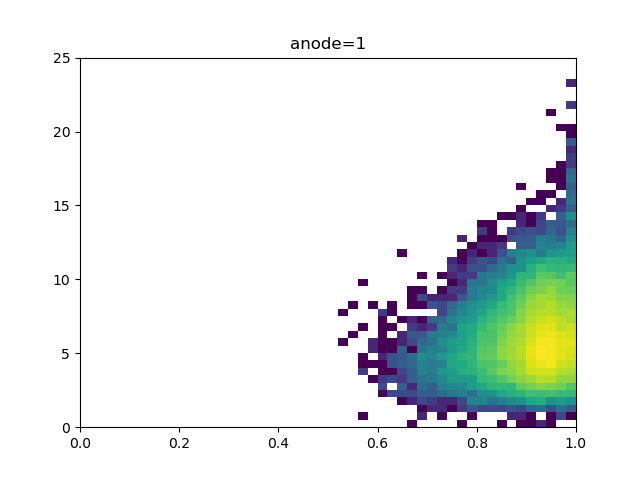

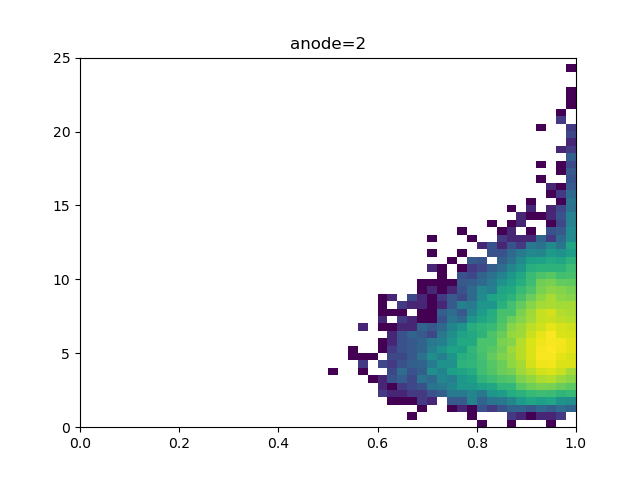

In [59]:
anode=1

for anode in [1,2]:
    eff = anode_efficiency[anode]
    dqdx_std = anode_eta_dqdx[anode]

    vals, bins = np.histogramdd( np.array([eff.flatten(), dqdx_std.flatten()]).transpose(), bins=(50,50), range=( (0,1), (0, 25)  ) )

    fig=plt.figure()
    ax=fig.add_subplot()
    ax.imshow(np.log(vals).transpose(), origin='lower', interpolation='none', aspect='auto', extent=(0,1,0,25))

    ax.set_title('anode={}'.format(anode))
    #ax.scatter( eff.flatten()[mask], dqdx_mean.flatten()[mask]  )

100%|██████████| 99062/99062 [00:00<00:00, 260275.10it/s]


100%|██████████| 99062/99062 [00:00<00:00, 663143.93it/s]


(array([ 9055., 29789., 18900., 41104.,   133.,    75.]),
 array([-1.        , -0.16666667,  0.66666667,  1.5       ,  2.33333333,
         3.16666667,  4.        ]),
 <BarContainer object of 6 artists>)

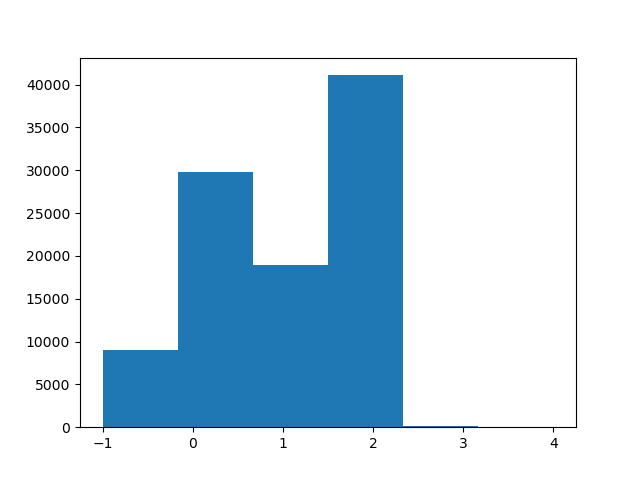

In [85]:
fig=plt.figure()
ax=fig.add_subplot()
ax.hist(thresholds_change, bins=6, range=(-1, 4))

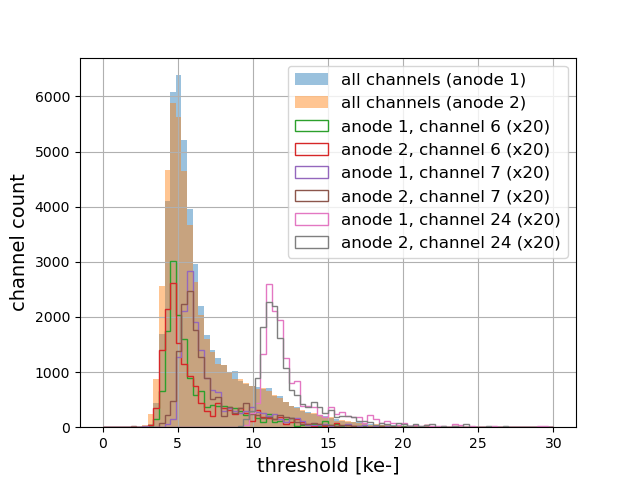

In [82]:
fig = plt.figure()
ax=fig.add_subplot()

m=(unique_to_io_group(unique_ids_set)==5)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), label='all channels (anode 1)', alpha=0.45);

m=(unique_to_io_group(unique_ids_set)==6)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), label='all channels (anode 2)', alpha=0.45);


m=(chan_ids==6) & (unique_to_io_group(unique_ids_set)==5)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), weights=[20]*np.sum(m), histtype='step', label='anode 1, channel 6 (x20)');

m=(chan_ids==6) & (unique_to_io_group(unique_ids_set)==6)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), weights=[20]*np.sum(m), histtype='step', label='anode 2, channel 6 (x20)');

m=(chan_ids==7) & (unique_to_io_group(unique_ids_set)==5)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), weights=[20]*np.sum(m), histtype='step', label='anode 1, channel 7 (x20)');
m=(chan_ids==7) & (unique_to_io_group(unique_ids_set)==6)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), weights=[20]*np.sum(m), histtype='step', label='anode 2, channel 7 (x20)');

m=(chan_ids==24) & (unique_to_io_group(unique_ids_set)==5)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), weights=[20]*np.sum(m), histtype='step', label='anode 1, channel 24 (x20)');
m=(chan_ids==24) & (unique_to_io_group(unique_ids_set)==6)
ax.hist(thresholds[m]+thresholds_change[m], bins=80, range=(0,30), weights=[20]*np.sum(m), histtype='step', label='anode 2, channel 24 (x20)');
ax.legend(fontsize=12)
ax.set_xlabel('threshold [ke-]', fontsize=14)
ax.set_ylabel('channel count', fontsize=14)
ax.grid()

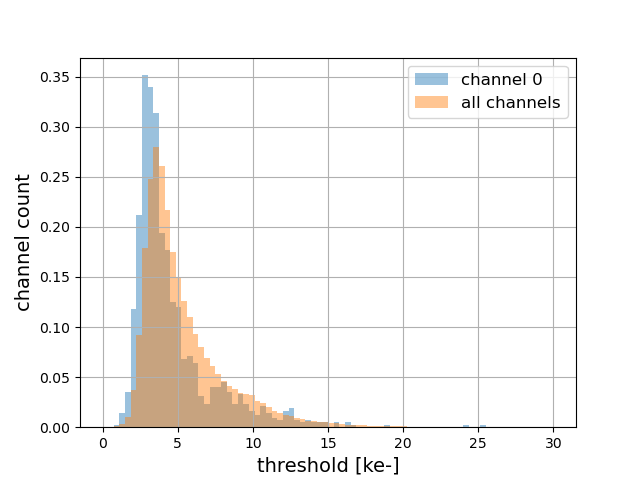

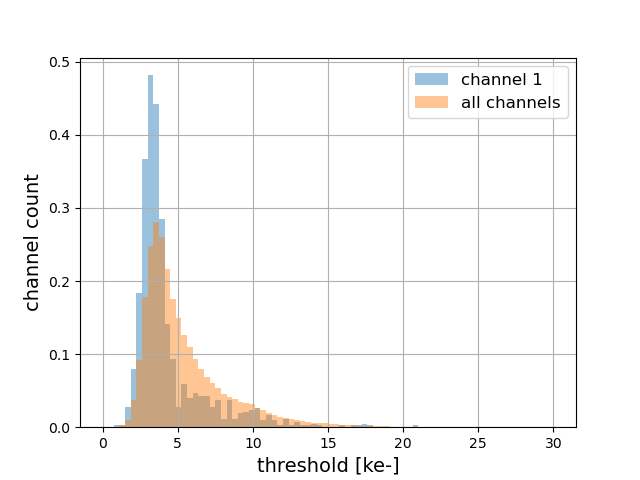

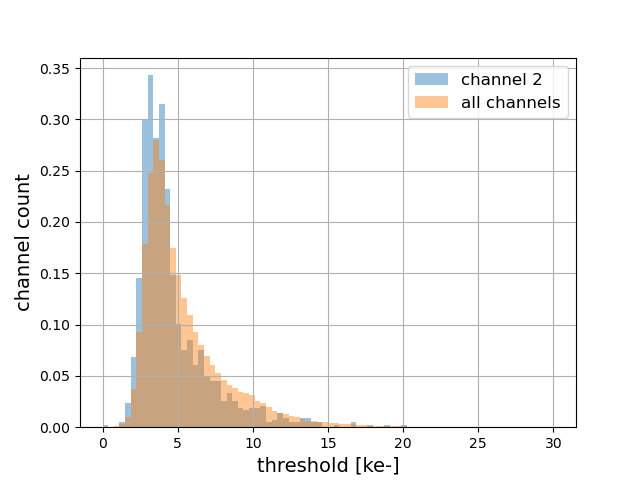

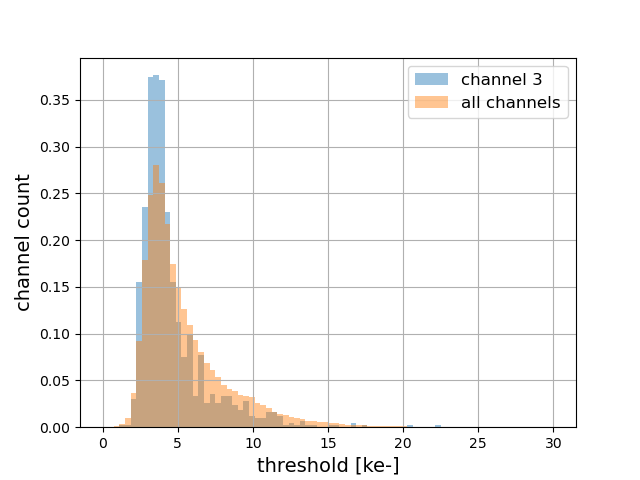

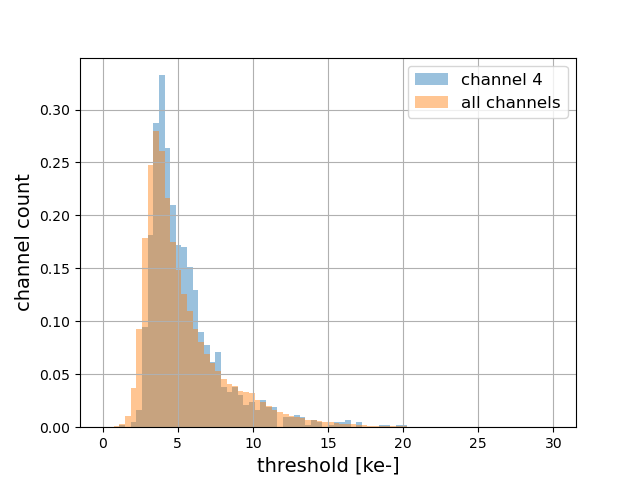

...

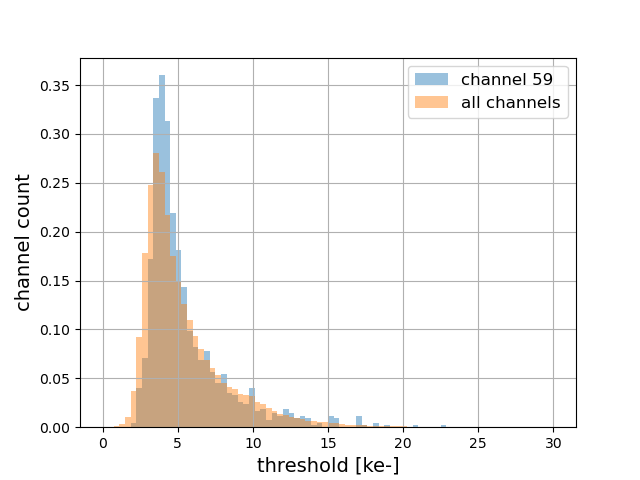

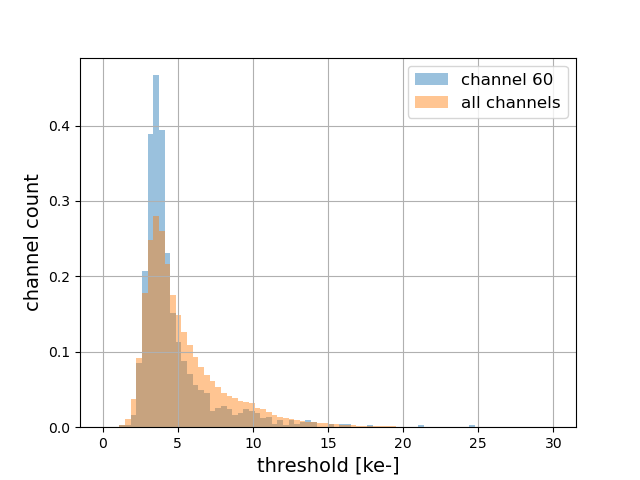

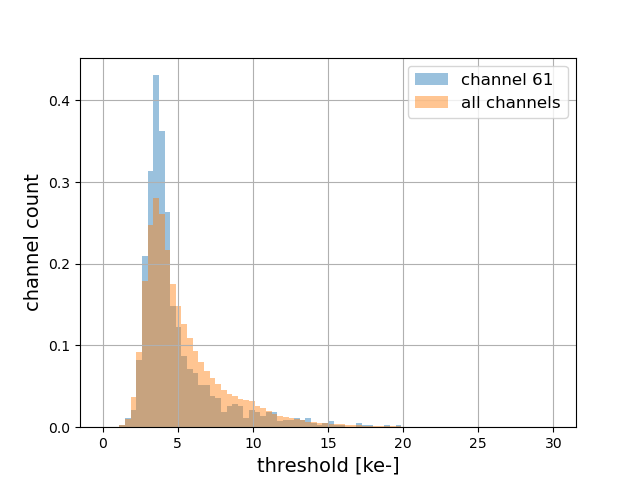

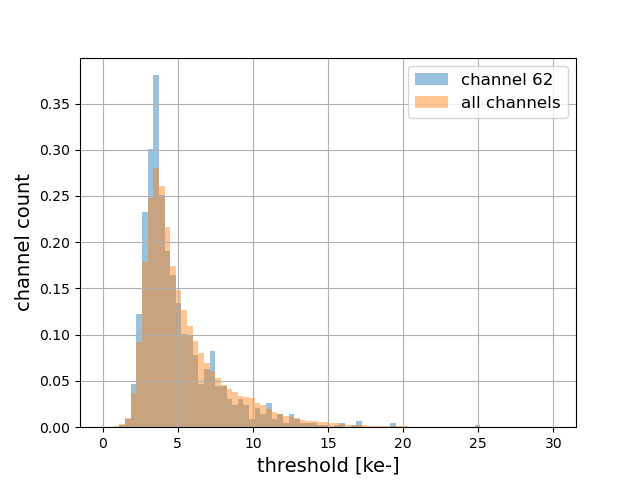

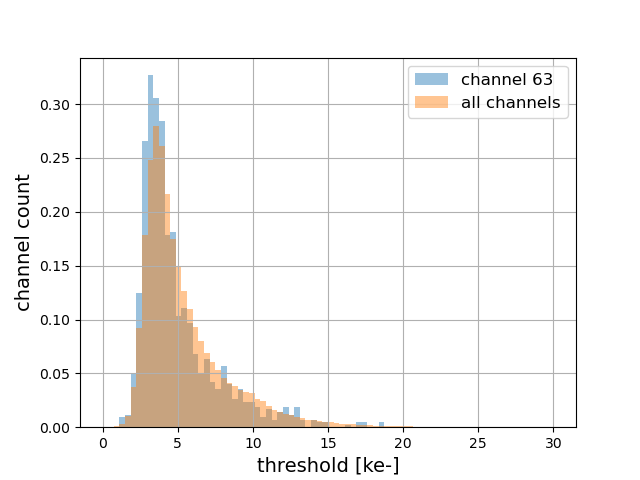

In [70]:
m_edge = (~((unique_to_chip_thresh(unique_ids_set) % 10)==0 )) & (~((unique_to_chip_thresh(unique_ids_set) % 10)==1 ))
m_edge = m_edge & (~((unique_to_chip_thresh(unique_ids_set) // 10)==0 )) & (~((unique_to_chip_thresh(unique_ids_set) // 10)==1 ))
for chan in range(64):
    fig = plt.figure()
    ax=fig.add_subplot()

    m=(unique_to_channel_thresh(unique_ids_set)==chan)

    # remove edge chips

    m = m & m_edge
    ax.hist(thresholds[m], bins=80, range=(0,30), label='channel {}'.format(chan), alpha=0.45, density=True);
    ax.hist(thresholds, bins=80, range=(0,30), label='all channels', alpha=0.45, density=True);

    ax.legend(fontsize=12)
    ax.set_xlabel('threshold [ke-]', fontsize=14)
    ax.set_ylabel('channel count', fontsize=14)
    ax.grid()

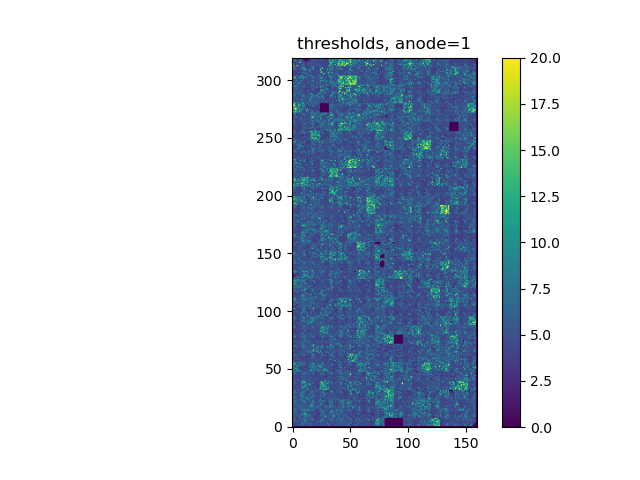

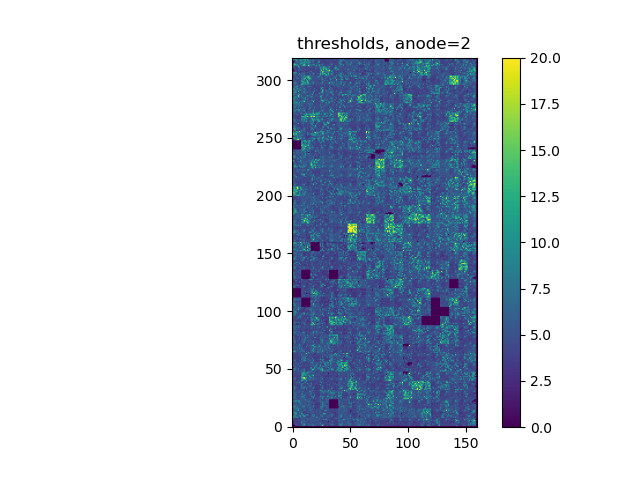

In [63]:
# make a map of thresholds

thresholds_anode = {}
chan_ids_anode = {}

for anode in [1, 2]:
    if anode==1: mh = unique_to_io_group_thresh(unique_ids_set)==5
    else: mh = unique_to_io_group_thresh(unique_ids_set)==6

    fig=plt.figure()
    ax=fig.add_subplot()
    ax.set_title('thresholds, anode={}'.format(anode))
    vals, bins = np.histogramdd( np.array([ pys[mh], pzs[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=thresholds[mh] )
    im = ax.imshow(vals, origin='lower', vmin=0, vmax=20)
    plt.colorbar(im, ax=ax)

    thresholds_anode[anode]=vals

    vals, bins = np.histogramdd( np.array([ pys[mh], pzs[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=chan_ids[mh] )

    chan_ids_anode[anode]=vals



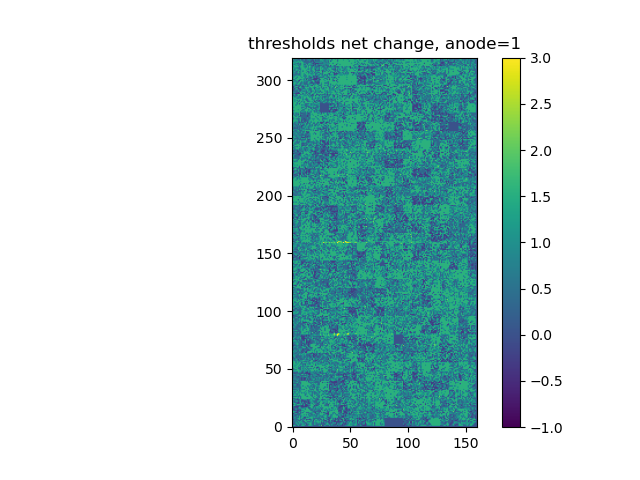

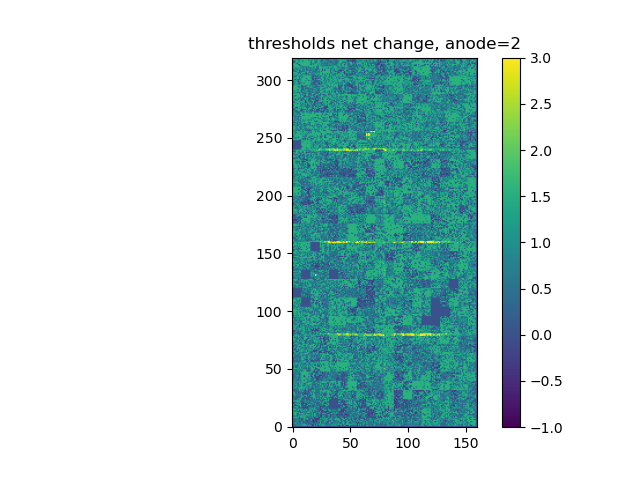

In [72]:
# make a map of thresholds

thresholds_change_anode = {}

for anode in [1, 2]:
    if anode==1: mh = unique_to_io_group_thresh(unique_ids_set)==5
    else: mh = unique_to_io_group_thresh(unique_ids_set)==6

    fig=plt.figure()
    ax=fig.add_subplot()
    ax.set_title('thresholds net change, anode={}'.format(anode))
    vals, bins = np.histogramdd( np.array([ pys[mh], pzs[mh] ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=thresholds_change[mh] )
    im = ax.imshow(vals, origin='lower', vmin=-1, vmax=3)
    plt.colorbar(im, ax=ax)

    thresholds_change_anode[anode]=vals



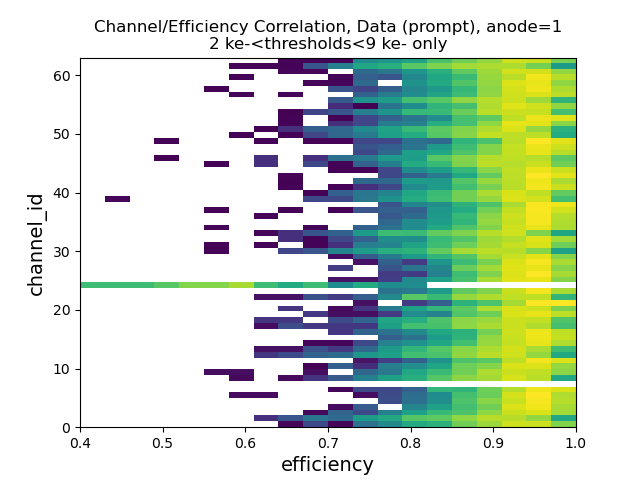

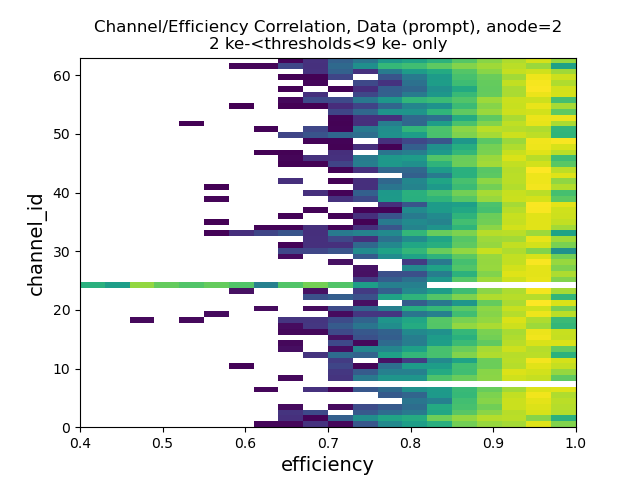

In [72]:
for anode in [1, 2]:

    fig=plt.figure()
    ax = fig.add_subplot()
    ax.set_title('Channel/Efficiency Correlation, Data (prompt), anode={}\n2 ke-<thresholds<9 ke- only'.format(anode))
    #ax.grid()
    ax.set_xlabel('efficiency', fontsize=14)
    ax.set_ylabel('channel_id', fontsize=14)
    mask = (~(np.isnan(anode_efficiency[anode]))).flatten()
    weights = ((thresholds_anode[anode]>2).astype(int).flatten()[mask]) & ((thresholds_anode[anode]<9).astype(int).flatten()[mask])
    dens, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask],chan_ids_anode[anode].flatten()[mask]]).transpose(), weights=weights, bins=(20, 64), range=( (0.4, 1), (0, 63) ) )

    norms = np.sum(dens, axis=0)
    norms[7]=np.nan
    dens = dens/norms
    ax.imshow(np.log(dens.transpose()), origin='lower', extent=(0.4, 1, 0, 63), aspect='auto')


    #ax.axvline(0.8, color='red', linestyle='--')
    #ax.axhline(8, color='red', linestyle='--' )

    #ax.fill_between( [0,0,0.8], [8, 8, 8], [8,30,30], color='red', alpha=0.1 )

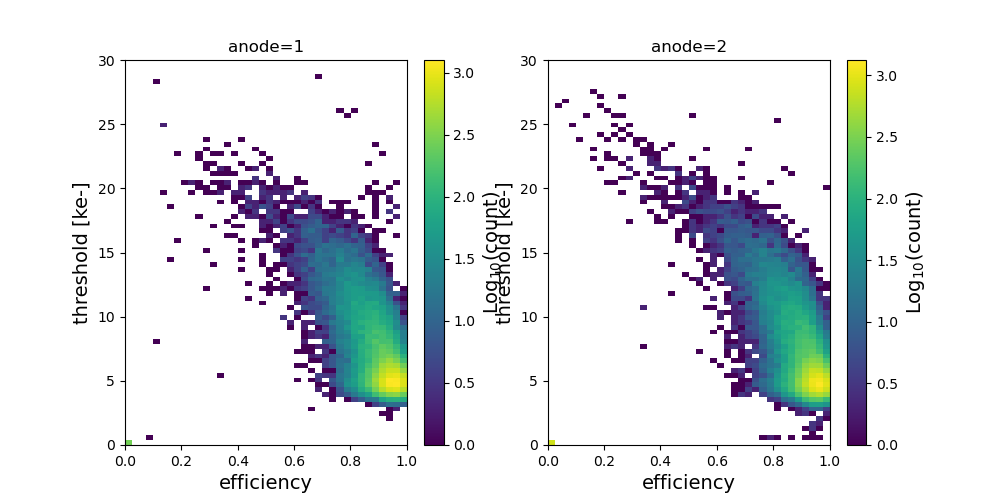

In [74]:
if True:
    fig=plt.figure(figsize=(10,5))
    #fig.suptitle('MiniRun6.4, Final hits')
    for anode in [1, 2]:
        ax = fig.add_subplot(1, 2, anode)
        ax.set_title('anode={}'.format(anode))
        ax.set_xlabel('efficiency', fontsize=14)
        ax.set_ylabel('threshold [ke-]', fontsize=14)
        mask = (~(np.isnan(anode_efficiency[anode]))).flatten()
        weights = (~( ( (chan_ids_anode[anode]==7).flatten()[mask]) | ((chan_ids_anode[anode]==6).flatten()[mask] ) | ((chan_ids_anode[anode]==24).flatten()[mask])  )).astype(int)
        np.sum(weights)
        dens, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask],(thresholds_anode[anode]+thresholds_change_anode[anode]).flatten()[mask]]).transpose(), weights=weights, bins=(40, 80), range=( (0, 1), (0, 30) ) )

        im=ax.imshow(np.log10(dens.transpose()), origin='lower', extent=(0, 1, 0, 30), aspect='auto')

        #ax.scatter( anode_efficiency[anode].flatten()[mask],thresholds_anode[anode].flatten()[mask], marker='.', s=1   )

        cb = plt.colorbar(im, ax=ax)

        cb.ax.set_ylabel('Log$_{10}$(count)', fontsize=14) 
    



IndexError: boolean index did not match indexed array along dimension 0; dimension is 1 but corresponding boolean dimension is 51200

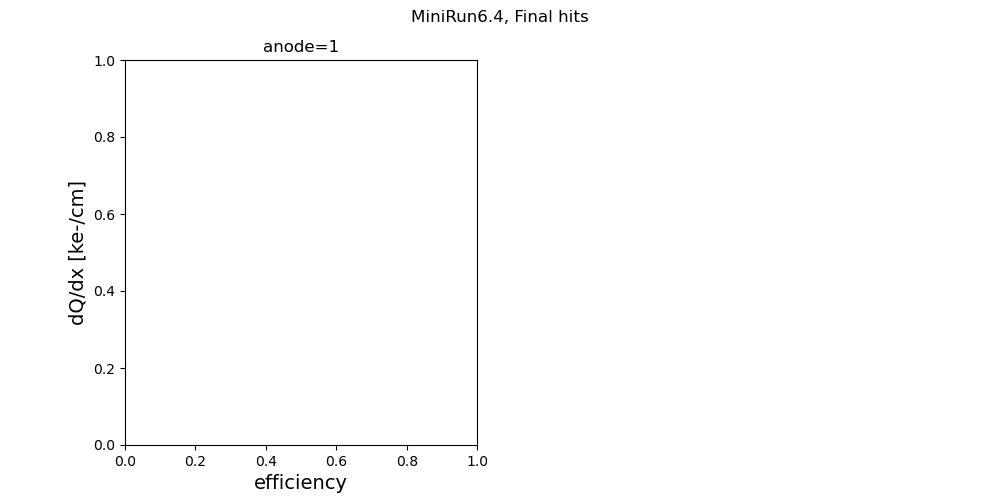

In [61]:
if True:
    fig=plt.figure(figsize=(10,5))
    fig.suptitle('MiniRun6.4, Final hits')
    for anode in [1, 2]:
        ax = fig.add_subplot(1, 2, anode)
        ax.set_title('anode={}'.format(anode))
        ax.set_xlabel('efficiency', fontsize=14)
        ax.set_ylabel('dQ/dx [ke-/cm]', fontsize=14)
        mask = (~(np.isnan(anode_efficiency[anode]))).flatten()
        weights = (~( ( (chan_ids_anode[anode]==7).flatten()[mask]) | ((chan_ids_anode[anode]==6).flatten()[mask] ) | ((chan_ids_anode[anode]==24).flatten()[mask])  )).astype(int)
        np.sum(weights)
        dens, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask],anode_dqdx[anode].flatten()[mask]]).transpose(), weights=weights, bins=(40, 80), range=( (0, 1), (10, 70) ) )

        im=ax.imshow(np.log10(dens.transpose()), origin='lower', extent=(0, 1, 0, 30), aspect='auto')

        cb = plt.colorbar(im, ax=ax)

        cb.ax.set_ylabel('Log$_{10}$(count)', fontsize=14) 
    



IndexError: boolean index did not match indexed array along dimension 0; dimension is 1 but corresponding boolean dimension is 51200

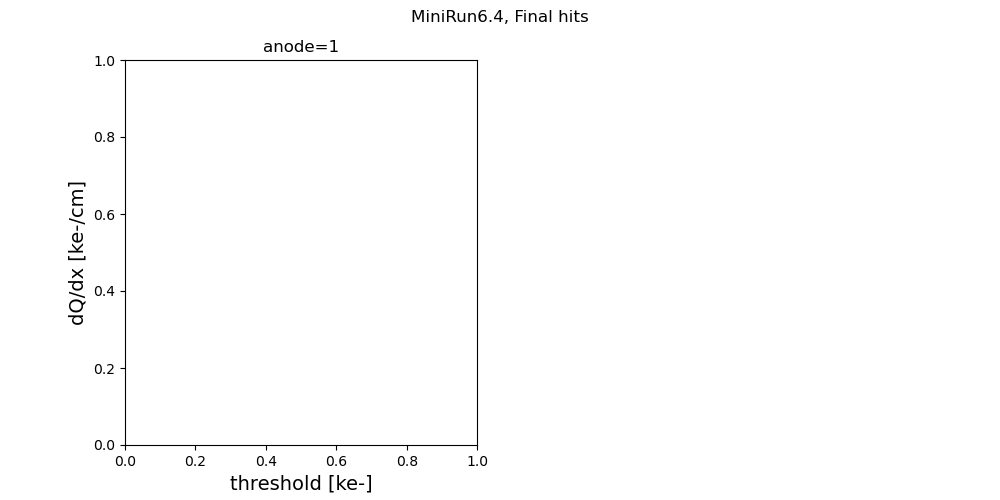

In [288]:
if True:
    fig=plt.figure(figsize=(10,5))
    fig.suptitle('MiniRun6.4, Final hits')
    for anode in [1, 2]:
        ax = fig.add_subplot(1, 2, anode)
        ax.set_title('anode={}'.format(anode))
        ax.set_xlabel('threshold [ke-]', fontsize=14)
        ax.set_ylabel('dQ/dx [ke-/cm]', fontsize=14)
        mask = (~(np.isnan(anode_efficiency[anode]))).flatten()
        weights = (~( ( (chan_ids_anode[anode]==7).flatten()[mask]) | ((chan_ids_anode[anode]==6).flatten()[mask] ) | ((chan_ids_anode[anode]==24).flatten()[mask])  )).astype(int)
        np.sum(weights)
        dens, bins = np.histogramdd( np.array([thresholds_anode[anode].flatten()[mask],anode_dqdx[anode].flatten()[mask]]).transpose(), weights=weights, bins=(40, 80), range=( (0, 30), (10, 70) ) )

        im=ax.imshow(np.log10(dens.transpose()), origin='lower', extent=(0, 30, 10, 70), aspect='auto')

        cb = plt.colorbar(im, ax=ax)

        cb.ax.set_ylabel('Log$_{10}$(count)', fontsize=14) 
    



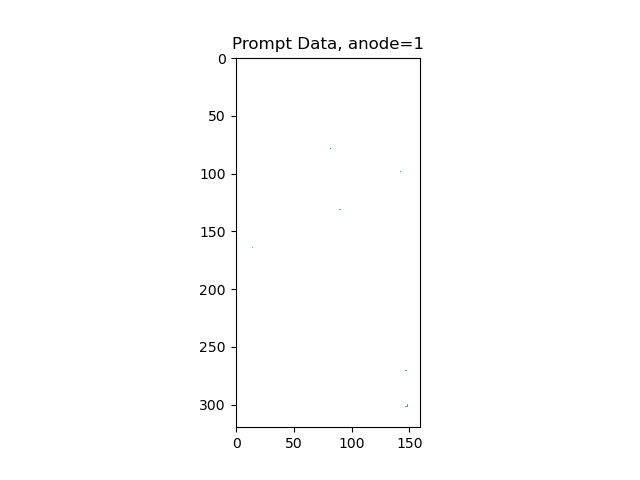

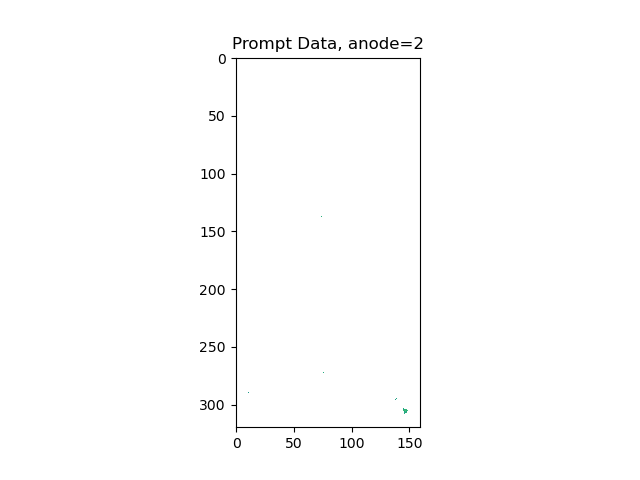

In [292]:
efficiency_outliers = {}

for anode in [1, 2]:

    eff = anode_efficiency[anode]
    efficiency_outliers[anode] = eff.copy()
    efficiency_outliers[anode][ eff>0.75 ]=np.nan
    efficiency_outliers[anode][ eff < 0.03 ]=np.nan
    efficiency_outliers[anode][ thresholds_anode[anode] > 10 ]=np.nan
    efficiency_outliers[anode][ thresholds_anode[anode] < 0 ]=np.nan

    fig=plt.figure()
    ax = fig.add_subplot()
    ax.set_title('Prompt Data, anode={}'.format(anode))
    ax.imshow(efficiency_outliers[anode], vmin=0, vmax=1)

    

In [293]:
# need to understand data loss aspect of this.
# --> make 2D map of data rate, incorperate hydra network to get something ~~pass through rate~~, # of branches, etc.
# superimpose hydra network


# get hydra networks 

packet_file_dir = '/global/cfs/cdirs/dune/www/data/2x2/nearline/packet/beam/july8_2024/nominal_hv/'

packet_files = [f for f in sorted(os.listdir(packet_file_dir)) if '0050017' in f] 

In [294]:
h5f = h5py.File(packet_file_dir + packet_files[1])

In [295]:
from matplotlib import pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import json
import numpy as np
import h5py 
import yaml
from tqdm import tqdm
import os
import io
from pathlib import Path
import tarfile

import h5py
import numpy as np

NAME='daq_configs'

def extract_config(file):
    with h5py.File(file) as h5f:
        buf = io.BytesIO(np.array(h5f[NAME]).data)
    extract=True
    with tarfile.open(fileobj=buf) as tarf:
        name = tarf.getmembers()[0].name
        if Path(name).exists():
            msg = f'Directory {name} already exists; not extracting, sorry'
            extract=False
        if extract: tarf.extractall()
    return name

def extract_network(name):
    network = {}
    for file in os.listdir(name+'/hydra_network'):
        with open(name+'/hydra_network/'+file) as f: d=json.load(f)
        for io_group in d['network'].keys():
            if io_group in ['miso_us_uart_map', 'miso_ds_uart_map', 'mosi_uart_map']: continue
            if not int(io_group) in network.keys(): network[int(io_group)]={}
            for io_channel in d['network'][io_group].keys():
                if not int(io_channel) in network[int(io_group)].keys(): network[int(io_group)][int(io_channel)] = []
                for i in range(len(d['network'][io_group][io_channel]['nodes'])-1):
                    network[int(io_group)][int(io_channel)].append(d['network'][io_group][io_channel]['nodes'][i+1]['chip_id'])    
    return network

def extract_network_branching(name):
    network = {}
    for file in os.listdir(name+'/hydra_network'):
        with open(name+'/hydra_network/'+file) as f: d=json.load(f)
        for io_group in d['network'].keys():
            if io_group in ['miso_us_uart_map', 'miso_ds_uart_map', 'mosi_uart_map']: continue
            if not int(io_group) in network.keys(): network[int(io_group)]={}
            for io_channel in d['network'][io_group].keys():
                if not int(io_channel) in network[int(io_group)].keys(): 
                    network[int(io_group)][int(io_channel)] = {
                        'network' : [],
                        'branches' : [],
                        'downstream' : {}
                        
                    }
                for i in range(len(d['network'][io_group][io_channel]['nodes'])-1):
                    current_chip = d['network'][io_group][io_channel]['nodes'][i+1]['chip_id']
                    
                    indx = -1
                    curr_chip_lookup = [current_chip in net for net in network[int(io_group)][int(io_channel)]['network']] 
                    if not any( curr_chip_lookup ):
                        network[int(io_group)][int(io_channel)]['network'].append( [current_chip] )
                        indx = 1
                    else:
                        indx = np.where( curr_chip_lookup )[0][0]+1

                    upstream_chips = list(set(d['network'][io_group][io_channel]['nodes'][i+1]['miso_us'])-set([None]) )
                    if len(upstream_chips)>0:
                        if len( network[int(io_group)][int(io_channel)]['network'] ) <= indx:
                            network[int(io_group)][int(io_channel)]['network'].append([])
                        network[int(io_group)][int(io_channel)]['network'][indx] += upstream_chips 

                    network[int(io_group)][int(io_channel)]['branches'].append( (current_chip, len(upstream_chips)) )
                    network[int(io_group)][int(io_channel)]['downstream'][current_chip]=upstream_chips
                            
    return network

def get_configs(name):
    configs = {}
    for file in os.listdir(name+'/asic_configs'):
        with open(name+'/asic_configs/'+file) as f: d=json.load(f)
        configs[d['meta']['CHIP_KEY']] = { reg : d[reg] for reg in d.keys() if not reg=='meta' }
        
    return configs

rawfile = packet_file_dir + packet_files[1]
name= extract_config(rawfile)

#configs=get_configs(name)

In [296]:
# network_b contains for each io_group, io_channel, a list of lists of chip ids at a specific network depth in 'network'
# also contains (chip_id, n_branches) in 'branches'
network_b = extract_network_branching(name)

In [297]:
unique_ids_set, index = np.unique(unique_ids, return_index=True) 
pys = py[index]
pzs = pz[index]

In [298]:
# make 2D map of number of network branches on the full anode

anode_n_hydra_branches = {}

for anode in [1, 2]:
    pyb = []
    pzb = []
    nbranch = []

    io_group = 4+anode
    for io_channel in tqdm(network_b[io_group].keys()):
        branches = network_b[io_group][io_channel]['branches']
        for (chip_id, n_branch) in branches:
            for chan in range(64):
                unique = unique_channel_id_thresh( io_group, io_channel, chip_id, chan  )
                m = unique_ids_set==unique
                if np.sum(m)==1:
                    pyb.append( pys[m][0] )
                    pzb.append( pzs[m][0] )
                    nbranch.append(n_branch)


    pyb = np.array(pyb)
    pzb = np.array(pzb)
    nbranch = np.array(nbranch)
    
    vals, bins = np.histogramdd( np.array([ pyb, pzb ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=nbranch )
    anode_n_hydra_branches[anode] = vals

                # 
                

100%|██████████| 32/32 [00:04<00:00,  7.32it/s]


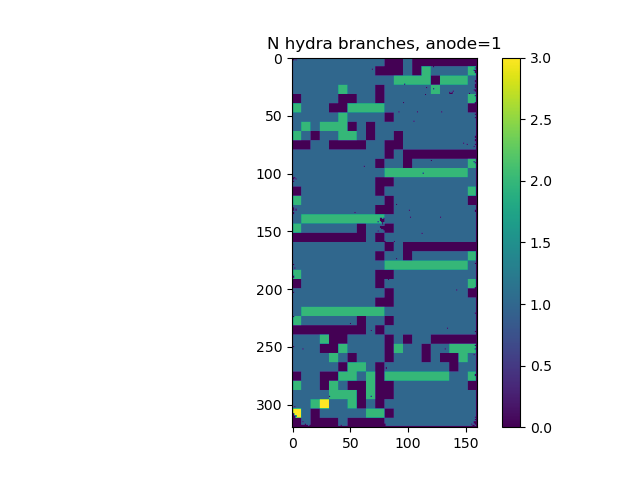

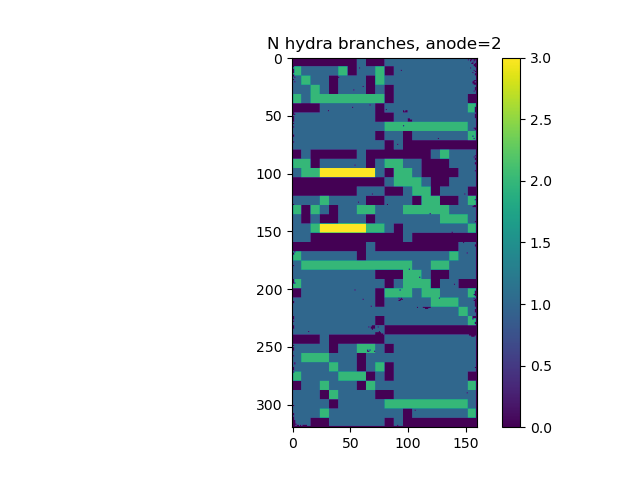

In [299]:
for anode in [1, 2]:
    fig=plt.figure()
    ax=fig.add_subplot()

    im = ax.imshow( anode_n_hydra_branches[anode] )
    plt.colorbar(im, ax=ax)
    ax.set_title('N hydra branches, anode={}'.format(anode))

In [300]:
# Get overall data rate for immediate downstream chips, (+channel?) across several files

all_chip_rates={}

for file in packet_files[0:10]:
    f=h5py.File(packet_file_dir+file)
    packets = f['packets']
    packets = packets[(packets['io_group']==5) | (packets['io_group']==6)]
    unique_chips = unique_channel_id_thresh( packets['io_group'].astype(int), packets['io_channel'].astype(int), packets['chip_id'].astype(int), 0 )
    
    for chip in tqdm(np.unique(unique_chips)):
        # get upsream chips
        io_group = unique_to_io_group_thresh(chip)
        io_channel = unique_to_tile_thresh(chip)
        chip_id = unique_to_chip_thresh(chip)

        if not io_channel in network_b[io_group].keys(): continue
        
        m = unique_chips==chip

        if chip_id in network_b[io_group][io_channel]['downstream'].keys():
            downstream = network_b[io_group][io_channel]['downstream'][chip_id]
            if len(downstream) > 0:
                for ch in downstream:
                    m = m | ( unique_chips==unique_channel_id_thresh(int(io_group), int(io_channel), int(ch), 0) )
                
        if not (chip in all_chip_rates.keys()): all_chip_rates[chip] = 0
        all_chip_rates[chip] += np.sum(m)
            

 15%|█▍        | 232/1588 [00:02<00:13, 102.31it/s]


KeyboardInterrupt: 

In [301]:
# make 2D map of ~data rate entering chip for the full anode 

anode_chip_rate = {}
found=0
for anode in [1, 2]:
    pyr = []
    pzr = []
    rate = []

    io_group = 4+anode
    for unique_chip in tqdm(all_chip_rates.keys()):
        if not unique_to_io_group_thresh(unique_chip)==io_group: continue
            
        for channel in range(64):
            unique = unique_chip + channel
            if True:
                m = unique_ids_set==unique
                if np.sum(m)==1:
                    found+=1
                    pyr.append( pys[m][0] )
                    pzr.append( pzs[m][0] )
                    rate.append(all_chip_rates[unique_chip])
                else:
                    pass
                    #print('not found!')

    pyr = np.array(pyr)
    pzr = np.array(pzr)
    rate = np.array(rate)
    
    vals, bins = np.histogramdd( np.array([ pyr, pzr ]).transpose(), bins=( pix_y_bins, pix_z_bins ), weights=rate )
    anode_chip_rate[anode] = vals

                # 
                

100%|██████████| 1586/1586 [00:04<00:00, 372.21it/s]


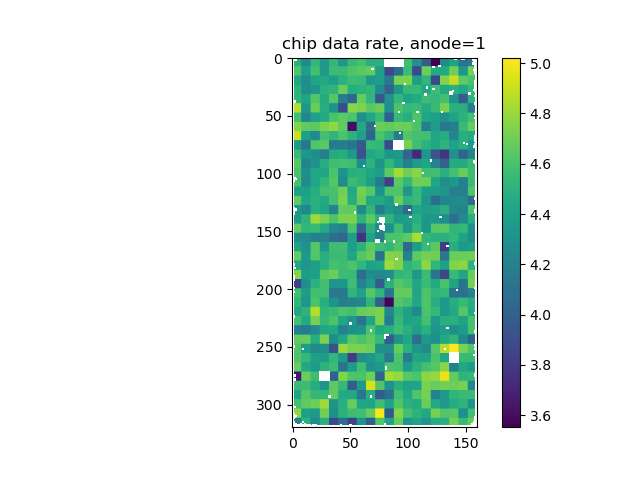

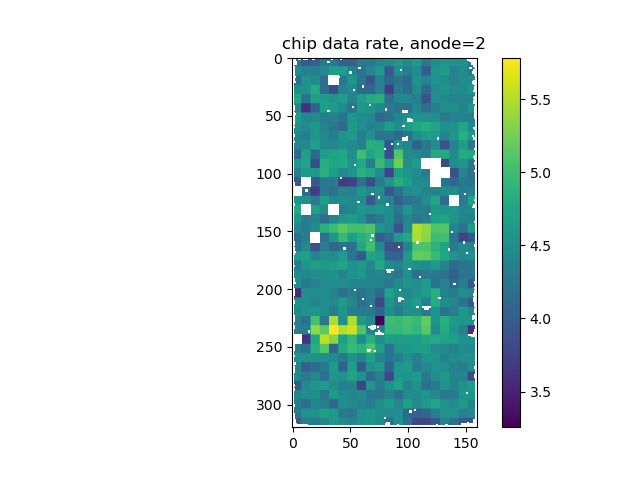

In [302]:
for anode in [1, 2]:
    fig=plt.figure()
    ax=fig.add_subplot()

    im = ax.imshow(np.log10(anode_chip_rate[anode]))
    plt.colorbar(im, ax=ax)
    ax.set_title('chip data rate, anode={}'.format(anode))

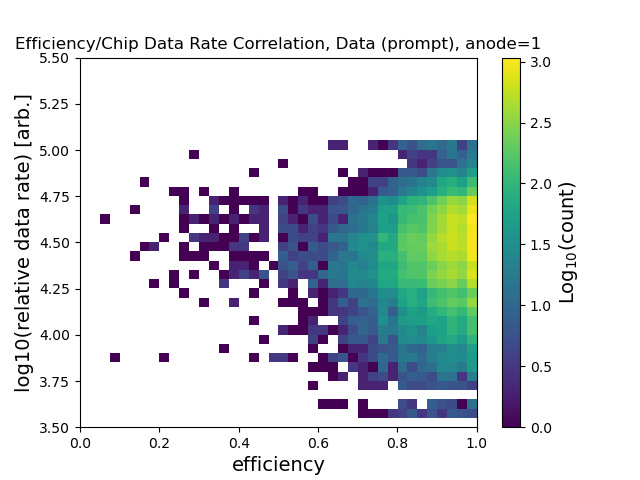

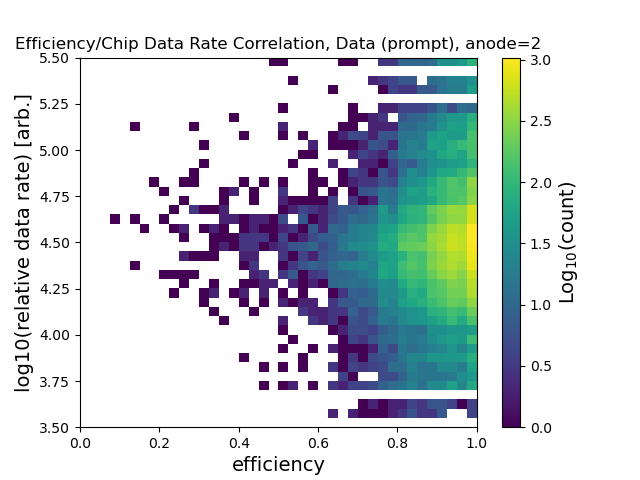

In [303]:
chan=-1
for anode in [1, 2]:

    fig=plt.figure()
    ax = fig.add_subplot()
    ax.set_title('Efficiency/Chip Data Rate Correlation, Data (prompt), anode={}'.format(anode, chan))
    #ax.grid()
    ax.set_xlabel('efficiency', fontsize=14)
    ax.set_ylabel('log10(relative data rate) [arb.]', fontsize=14)
    mask = (~(np.isnan(anode_efficiency[anode]))).flatten()
    weights = (thresholds_anode[anode] < 10.0).flatten()
    dens, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask],np.log10(anode_chip_rate[anode]).flatten()[mask]]).transpose(),\
                                weights=weights[mask], bins=(40, 40), range=( (0, 1), (3.5, 5.5) ) )

    im=ax.imshow(np.log10(dens.transpose()), origin='lower', extent=(0, 1, 3.5, 5.5), aspect='auto')

    cb = plt.colorbar(im, ax=ax)

    cb.ax.set_ylabel('Log$_{10}$(count)', fontsize=14) 
    


    #ax.axvline(0.75, color='red', linestyle='--')
    #ax.axhline(8, color='red', linestyle='--' )

    #ax.fill_between( [0,0,0.75], [0, 0, 0], [0,8,8], color='red', alpha=0.1 )

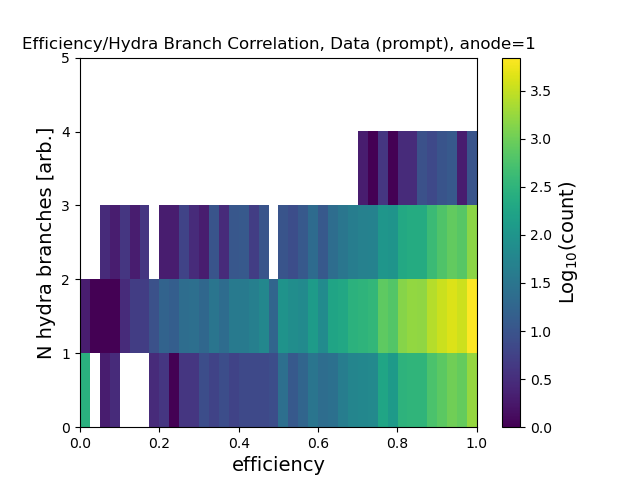

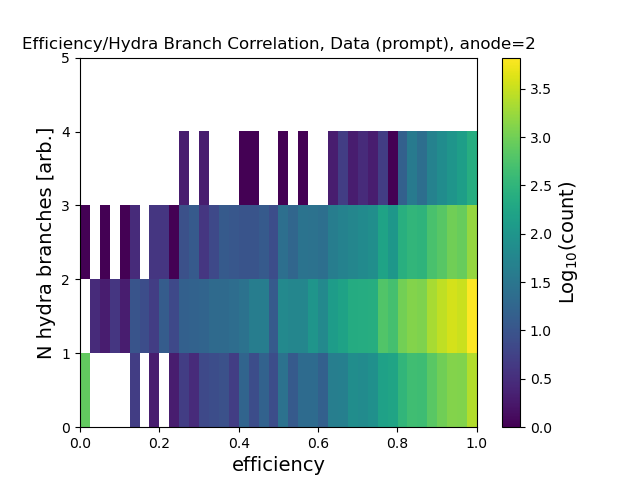

In [304]:
chan=-1
for anode in [1, 2]:

    fig=plt.figure()
    ax = fig.add_subplot()
    ax.set_title('Efficiency/Hydra Branch Correlation, Data (prompt), anode={}'.format(anode, chan))
    #ax.grid()
    ax.set_xlabel('efficiency', fontsize=14)
    ax.set_ylabel('N hydra branches [arb.]', fontsize=14)
    mask = (~(np.isnan(anode_efficiency[anode]))).flatten()
    dens, bins = np.histogramdd( np.array([anode_efficiency[anode].flatten()[mask],anode_n_hydra_branches[anode].flatten()[mask]]).transpose(), bins=(40, 5), range=( (0, 1), (0, 5) ) )

    im=ax.imshow(np.log10(dens.transpose()), origin='lower', extent=(0, 1, 0, 5), aspect='auto')

    cb = plt.colorbar(im, ax=ax)

    cb.ax.set_ylabel('Log$_{10}$(count)', fontsize=14) 
    


    #ax.axvline(0.75, color='red', linestyle='--')
    #ax.axhline(8, color='red', linestyle='--' )

    #ax.fill_between( [0,0,0.75], [0, 0, 0], [0,8,8], color='red', alpha=0.1 )